In [83]:
import pandas as pd
import numpy as np
import seaborn as sns
import datetime
import math
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D

In [84]:
plt.rcParams['agg.path.chunksize'] = 150

# Combined Data

In [85]:
# data = pd.read_csv("data/csv/still/still.csv")
# data = data.sample(frac=0.2)

# data = pd.read_csv("data/csv/still/0/wo_1_1_0.csv")

# data.head()

In [86]:
# # Plotting the data
# plt.figure(figsize=(10, 6))

# # Plot Ant1 and Ant2 amplitudes
# plt.plot(data["subcarriers"], data["ant1_amplitude"], label="Ant1 Amplitude", marker='o')
# # plt.plot(data["subcarriers"], data["ant2_amplitude"], label="Ant2 Amplitude", marker='x')

# # Adding labels and title
# plt.xlabel("Subcarriers")
# plt.ylabel("Amplitude")
# plt.title("Amplitude vs Subcarriers for Ant1")
# plt.legend()

# # Show the plot
# plt.show()

In [87]:
# # Plotting the data
# plt.figure(figsize=(10, 6))

# # Plot Ant1 and Ant2 amplitudes
# plt.plot(data["subcarriers"], data["ant2_amplitude"], label="Ant2 Amplitude", marker='x')

# # Adding labels and title
# plt.xlabel("Subcarriers")
# plt.ylabel("Amplitude")
# plt.title("Amplitude vs Subcarriers for Ant2")
# plt.legend()

# # Show the plot
# plt.show()

In [88]:
# data.plot(subplots=True, layout=(len(data.columns)//2, 2), figsize=(12, 15), sharex=True)
# plt.tight_layout()
# plt.show()

In [89]:
wo_1_1_0 = pd.read_csv("data/csv/still/0/wo_1_1_0.csv")
# wo_1_1_0 = pd.read_csv("data/csv/still_with_receiver/0/w_1_1_0.csv")

wo_1_1_0.head()

,timestamps,csi_len,channel,err_info,noise_floor,rate,bandWidth,num_tones,nr,nc,...,payload_length,block_length,subcarriers,ant1_amplitude,ant2_amplitude,ant1_phase,ant2_phase,with_receiver,coord1,coord2
0,429192390,560,2437,0,0,140,0,56,2,2,...,1320,1904,1,27.459060,92.070625,0.992894,-1.418147,0,1,1
1,429192390,560,2437,0,0,140,0,56,2,2,...,1320,1904,2,27.459060,167.839209,-0.992894,1.994465,0,1,1
2,429192390,560,2437,0,0,140,0,56,2,2,...,1320,1904,3,28.844410,94.339811,0.982794,-1.485895,0,1,1
3,429192390,560,2437,0,0,140,0,56,2,2,...,1320,1904,4,29.154759,174.642492,-1.030377,1.983207,0,1,1
4,429192390,560,2437,0,0,140,0,56,2,2,...,1320,1904,5,30.805844,89.453899,0.946773,-1.470015,0,1,1


# Location (1, 1) Round 1

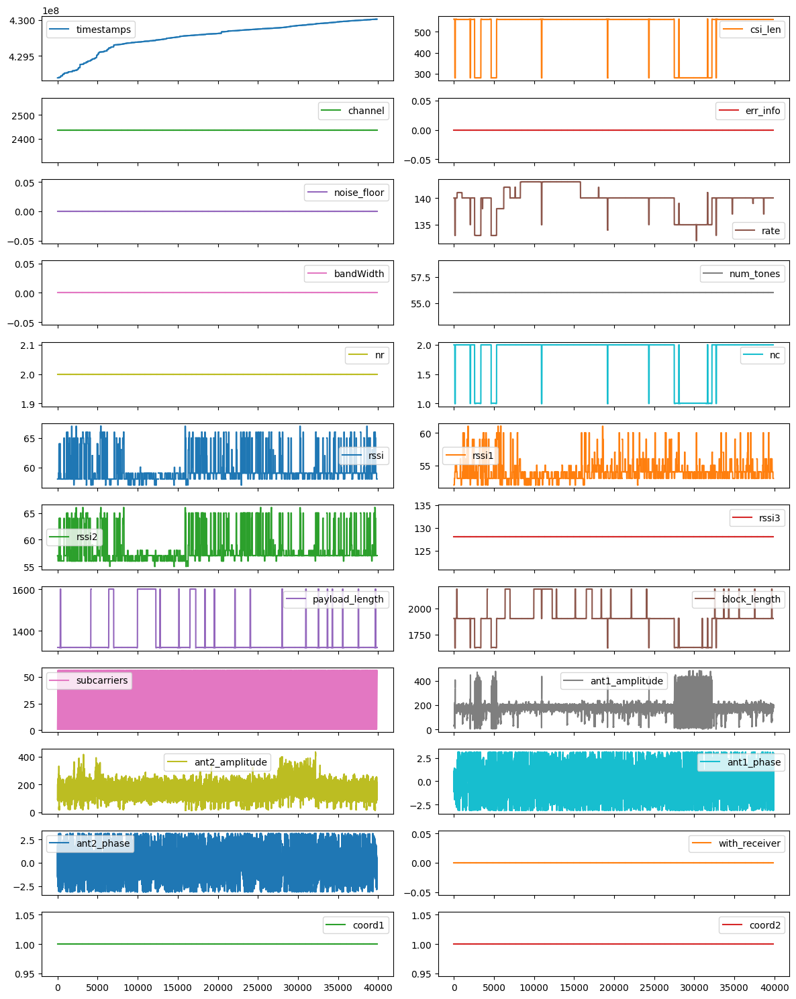

In [90]:
wo_1_1_0.plot(subplots=True, layout=(len(wo_1_1_0.columns)//2, 2), figsize=(12, 15), sharex=True)
plt.tight_layout()
plt.show()

In [91]:
wo_1_1_0.drop(columns=["coord1", "coord2", "with_receiver", "rssi3", "nr", "num_tones", "noise_floor", "channel", "err_info"], inplace=True)
wo_1_1_0.head()

,timestamps,csi_len,rate,bandWidth,nc,rssi,rssi1,rssi2,payload_length,block_length,subcarriers,ant1_amplitude,ant2_amplitude,ant1_phase,ant2_phase
0,429192390,560,140,0,2,58,52,57,1320,1904,1,27.459060,92.070625,0.992894,-1.418147
1,429192390,560,140,0,2,58,52,57,1320,1904,2,27.459060,167.839209,-0.992894,1.994465
2,429192390,560,140,0,2,58,52,57,1320,1904,3,28.844410,94.339811,0.982794,-1.485895
3,429192390,560,140,0,2,58,52,57,1320,1904,4,29.154759,174.642492,-1.030377,1.983207
4,429192390,560,140,0,2,58,52,57,1320,1904,5,30.805844,89.453899,0.946773,-1.470015


## Amplitude

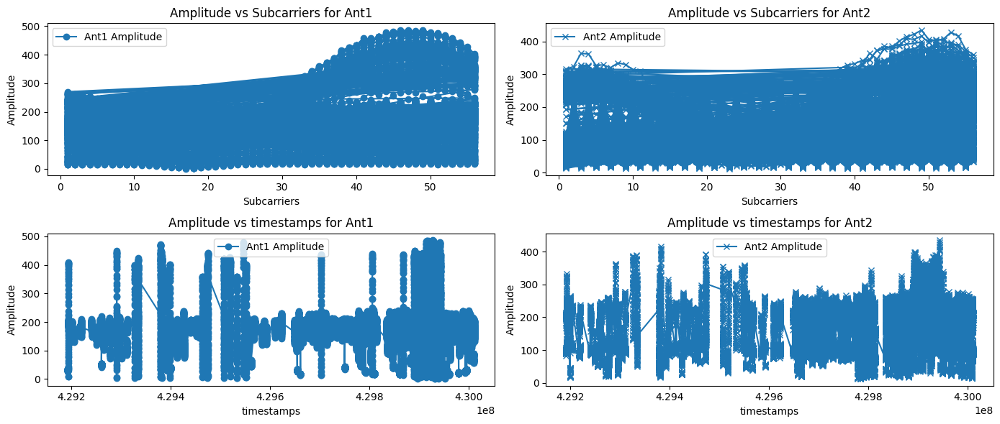

In [92]:
# Create a figure and set of subplots (2 columns)
fig, ax = plt.subplots(2, 2, figsize=(14, 6))

# Plot for Ant1 Amplitude on the first subplot
ax[0][0].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o')
ax[0][0].set_xlabel("Subcarriers")
ax[0][0].set_ylabel("Amplitude")
ax[0][0].set_title("Amplitude vs Subcarriers for Ant1")
ax[0][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[0][1].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant2_amplitude"], label="Ant2 Amplitude", marker='x')
ax[0][1].set_xlabel("Subcarriers")
ax[0][1].set_ylabel("Amplitude")
ax[0][1].set_title("Amplitude vs Subcarriers for Ant2")
ax[0][1].legend()

# Plot for Ant1 Amplitude on the first subplot
ax[1][0].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o')
ax[1][0].set_xlabel("timestamps")
ax[1][0].set_ylabel("Amplitude")
ax[1][0].set_title("Amplitude vs timestamps for Ant1")
ax[1][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[1][1].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant2_amplitude"], label="Ant2 Amplitude", marker='x')
ax[1][1].set_xlabel("timestamps")
ax[1][1].set_ylabel("Amplitude")
ax[1][1].set_title("Amplitude vs timestamps for Ant2")
ax[1][1].legend()

# Adjust the layout
plt.tight_layout()

# Show the plots
plt.show()

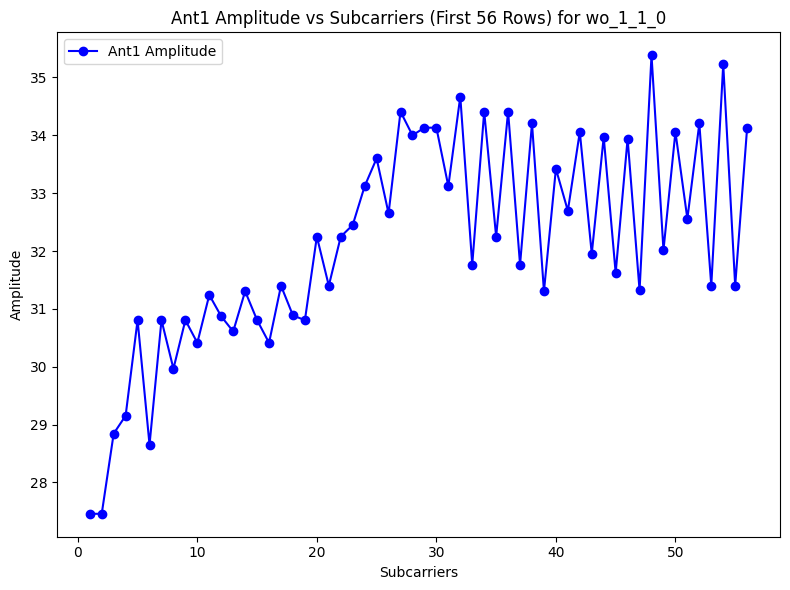

In [93]:
# Plotting Amplitude vs Subcarriers for Ant1 for wo_1_1_0 for only the first 56 rows
plt.figure(figsize=(8, 6))

# Extracting the first 56 rows
subcarriers_first_56 = wo_1_1_0["subcarriers"][:56]
amplitude_ant1_first_56 = wo_1_1_0["ant1_amplitude"][:56]

# Plotting
plt.plot(subcarriers_first_56, amplitude_ant1_first_56, label="Ant1 Amplitude", marker='o', color='blue')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Ant1 Amplitude vs Subcarriers (First 56 Rows) for wo_1_1_0")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


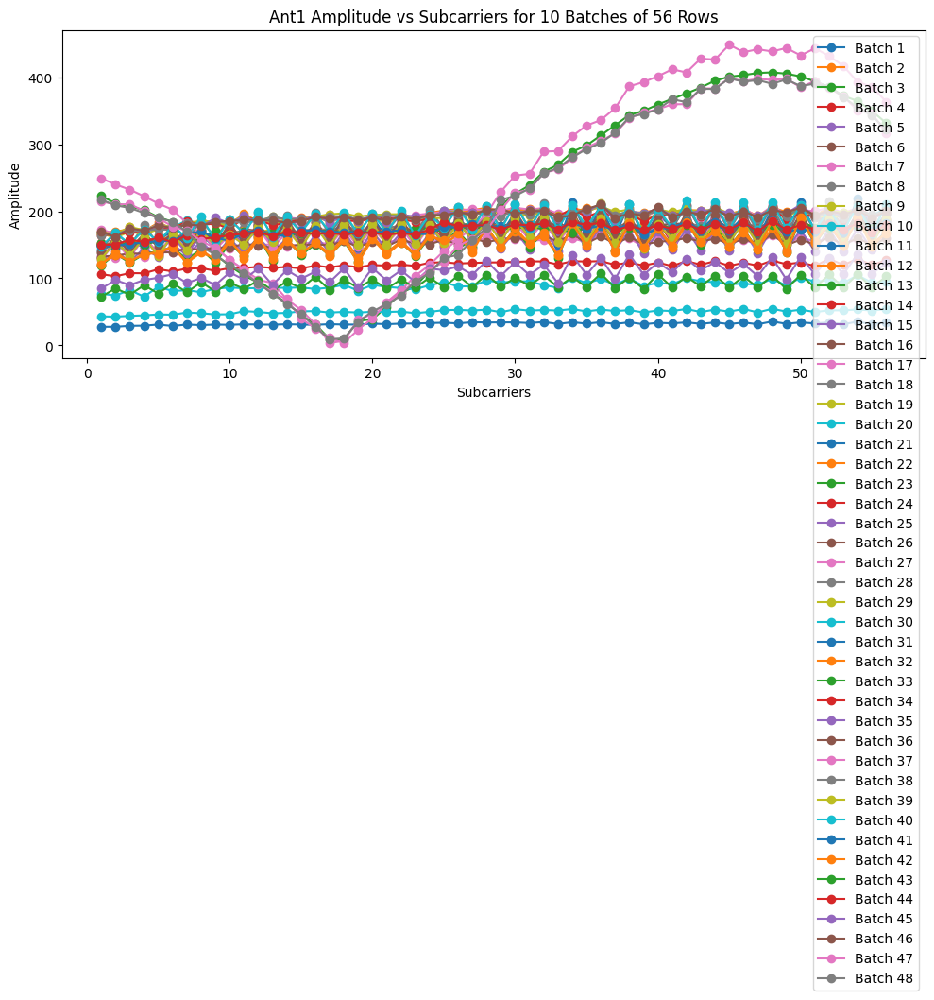

In [94]:
plt.figure(figsize=(10, 8))

# Plot 10 graphs, each containing 56 rows of data
for i in range(48):
    start = i * 56
    end = start + 56
    subcarriers_batch = wo_1_1_0["subcarriers"][start:end]
    amplitude_batch = wo_1_1_0["ant1_amplitude"][start:end]
    
    plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i+1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Ant1 Amplitude vs Subcarriers for 10 Batches of 56 Rows")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

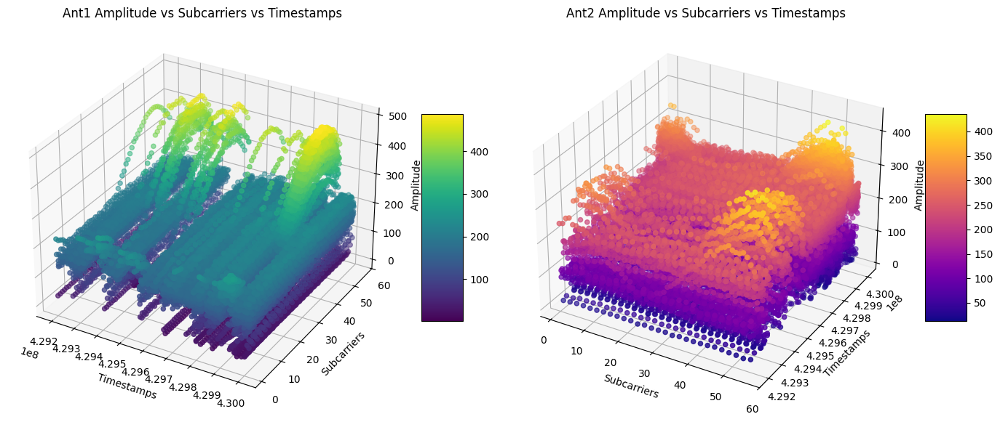

In [95]:
# Create a figure with two subplots for side-by-side 3D scatter plots
fig = plt.figure(figsize=(14, 6))

# First subplot for Ant1 Amplitude
ax1 = fig.add_subplot(121, projection='3d')
subcarriers = wo_1_1_0["subcarriers"]
amplitude_ant1 = wo_1_1_0["ant1_amplitude"]
timestamps = wo_1_1_0["timestamps"]

# 3D scatter plot for Ant1
# scatter1 = ax1.scatter(subcarriers, timestamps, amplitude_ant1, c=amplitude_ant1, cmap='viridis')
scatter1 = ax1.scatter(timestamps, subcarriers, amplitude_ant1, c=amplitude_ant1, cmap='viridis')
ax1.set_ylabel('Subcarriers')
ax1.set_xlabel('Timestamps')
ax1.set_zlabel('Amplitude')
ax1.set_title('Ant1 Amplitude vs Subcarriers vs Timestamps')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot for Ant2 Amplitude
ax2 = fig.add_subplot(122, projection='3d')
amplitude_ant2 = wo_1_1_0["ant2_amplitude"]

# 3D scatter plot for Ant2
scatter2 = ax2.scatter(subcarriers, timestamps, amplitude_ant2, c=amplitude_ant2, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Amplitude')
ax2.set_title('Ant2 Amplitude vs Subcarriers vs Timestamps')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Adjust layout and display
plt.tight_layout()
plt.show()

## Phase

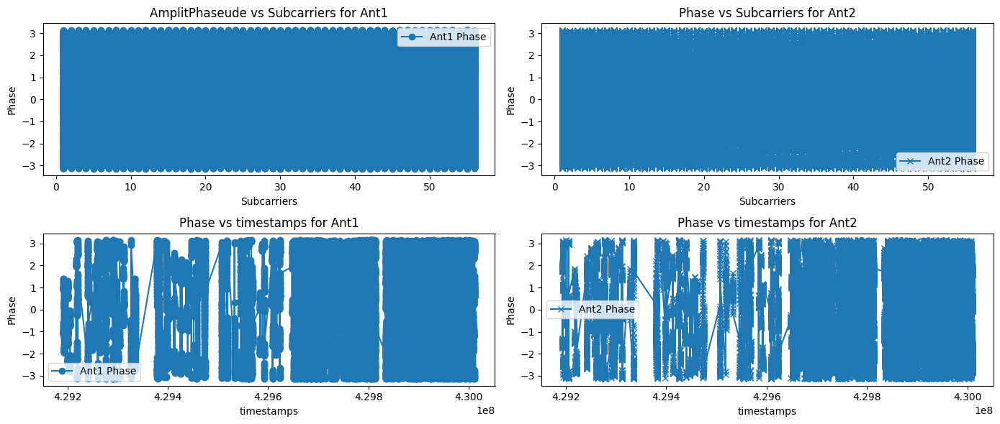

In [96]:
# Create a figure and set of subplots (2 columns)
fig, ax = plt.subplots(2, 2, figsize=(14, 6))

# Plot for Ant1 Amplitude on the first subplot
ax[0][0].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant1_phase"], label="Ant1 Phase", marker='o')
ax[0][0].set_xlabel("Subcarriers")
ax[0][0].set_ylabel("Phase")
ax[0][0].set_title("AmplitPhaseude vs Subcarriers for Ant1")
ax[0][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[0][1].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant2_phase"], label="Ant2 Phase", marker='x')
ax[0][1].set_xlabel("Subcarriers")
ax[0][1].set_ylabel("Phase")
ax[0][1].set_title("Phase vs Subcarriers for Ant2")
ax[0][1].legend()

# Plot for Ant1 Amplitude on the first subplot
ax[1][0].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant1_phase"], label="Ant1 Phase", marker='o')
ax[1][0].set_xlabel("timestamps")
ax[1][0].set_ylabel("Phase")
ax[1][0].set_title("Phase vs timestamps for Ant1")
ax[1][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[1][1].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant2_phase"], label="Ant2 Phase", marker='x')
ax[1][1].set_xlabel("timestamps")
ax[1][1].set_ylabel("Phase")
ax[1][1].set_title("Phase vs timestamps for Ant2")
ax[1][1].legend()

# Adjust the layout
plt.tight_layout()

# Show the plots
plt.show()

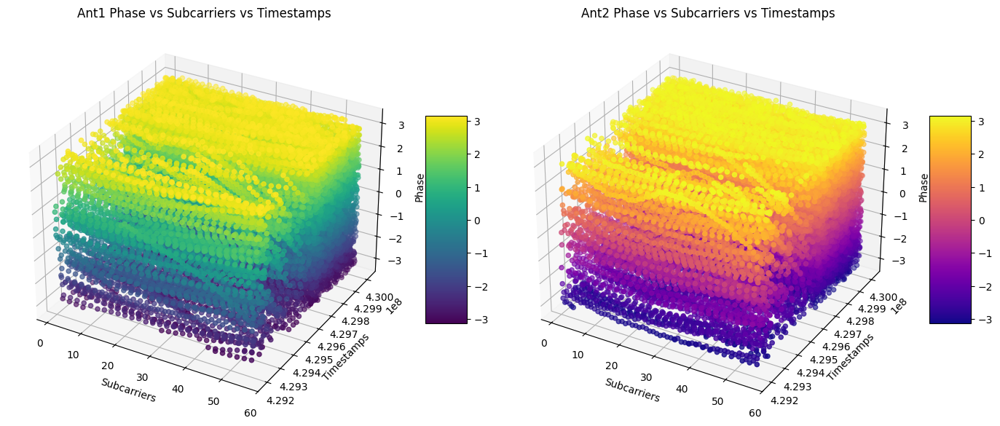

In [97]:
# Create a figure with two subplots for side-by-side 3D scatter plots
fig = plt.figure(figsize=(14, 6))

# First subplot for Ant1 Phase
ax1 = fig.add_subplot(121, projection='3d')
subcarriers = wo_1_1_0["subcarriers"]
phase_ant1 = wo_1_1_0["ant1_phase"]
timestamps = wo_1_1_0["timestamps"]

# 3D scatter plot for Ant1 Phase
scatter1 = ax1.scatter(subcarriers, timestamps, phase_ant1, c=phase_ant1, cmap='viridis')
ax1.set_xlabel('Subcarriers')
ax1.set_ylabel('Timestamps')
ax1.set_zlabel('Phase')
ax1.set_title('Ant1 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot for Ant2 Phase
ax2 = fig.add_subplot(122, projection='3d')
phase_ant2 = wo_1_1_0["ant2_phase"]

# 3D scatter plot for Ant2 Phase
scatter2 = ax2.scatter(subcarriers, timestamps, phase_ant2, c=phase_ant2, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Phase')
ax2.set_title('Ant2 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Adjust layout and display
plt.tight_layout()
plt.show()

## RSSI

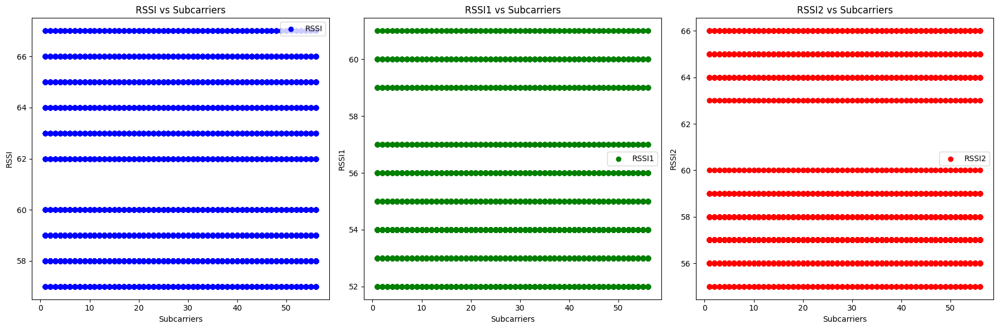

In [98]:
# Create a figure with three subplots for side-by-side 2D scatter plots
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Plot RSSI vs Subcarriers in the first subplot
ax[0].scatter(wo_1_1_0["subcarriers"], wo_1_1_0["rssi"], color='blue', label="RSSI")
ax[0].set_xlabel('Subcarriers')
ax[0].set_ylabel('RSSI')
ax[0].set_title('RSSI vs Subcarriers')
ax[0].legend()

# Plot RSSI1 vs Subcarriers in the second subplot
ax[1].scatter(wo_1_1_0["subcarriers"], wo_1_1_0["rssi1"], color='green', label="RSSI1")
ax[1].set_xlabel('Subcarriers')
ax[1].set_ylabel('RSSI1')
ax[1].set_title('RSSI1 vs Subcarriers')
ax[1].legend()

# Plot RSSI2 vs Subcarriers in the third subplot
ax[2].scatter(wo_1_1_0["subcarriers"], wo_1_1_0["rssi2"], color='red', label="RSSI2")
ax[2].set_xlabel('Subcarriers')
ax[2].set_ylabel('RSSI2')
ax[2].set_title('RSSI2 vs Subcarriers')
ax[2].legend()

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

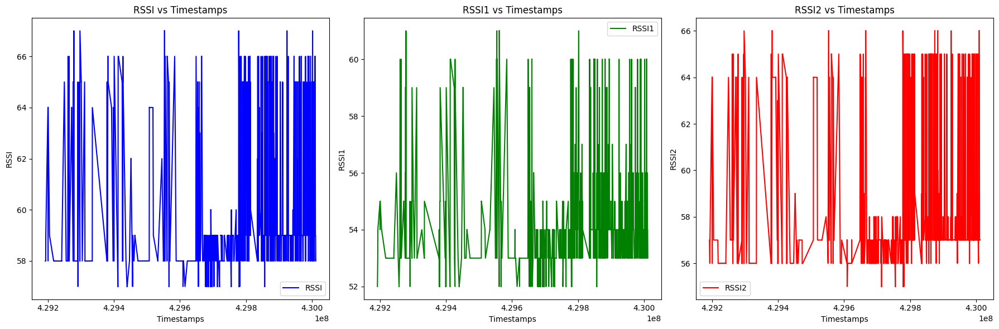

In [99]:
# Create a figure with three subplots for side-by-side 2D scatter plots
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Plot RSSI vs Timestamps in the first subplot
ax[0].plot(wo_1_1_0["timestamps"], wo_1_1_0["rssi"], color='blue', label="RSSI")
ax[0].set_xlabel('Timestamps')
ax[0].set_ylabel('RSSI')
ax[0].set_title('RSSI vs Timestamps')
ax[0].legend()

# Plot RSSI1 vs Timestamps in the second subplot
ax[1].plot(wo_1_1_0["timestamps"], wo_1_1_0["rssi1"], color='green', label="RSSI1")
ax[1].set_xlabel('Timestamps')
ax[1].set_ylabel('RSSI1')
ax[1].set_title('RSSI1 vs Timestamps')
ax[1].legend()

# Plot RSSI2 vs Timestamps in the third subplot
ax[2].plot(wo_1_1_0["timestamps"], wo_1_1_0["rssi2"], color='red', label="RSSI2")
ax[2].set_xlabel('Timestamps')
ax[2].set_ylabel('RSSI2')
ax[2].set_title('RSSI2 vs Timestamps')
ax[2].legend()

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

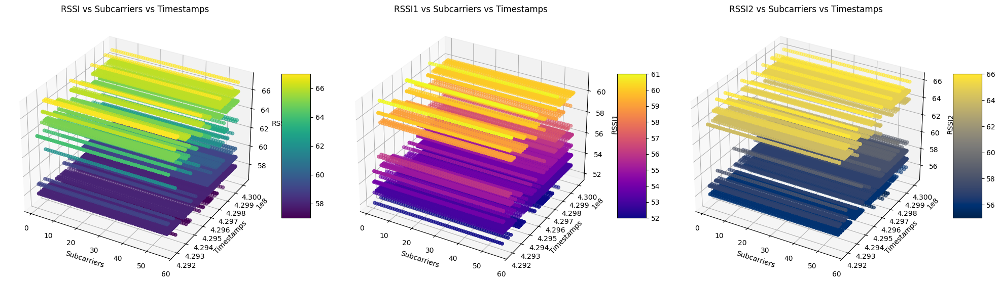

In [100]:
# Create a figure with three subplots for side-by-side 3D scatter plots
fig = plt.figure(figsize=(20, 6))

# First subplot for RSSI
ax1 = fig.add_subplot(131, projection='3d')
subcarriers = wo_1_1_0["subcarriers"]
rssi = wo_1_1_0["rssi"]
timestamps = wo_1_1_0["timestamps"]

# 3D scatter plot for RSSI
scatter1 = ax1.scatter(subcarriers, timestamps, rssi, c=rssi, cmap='viridis')
ax1.set_xlabel('Subcarriers')
ax1.set_ylabel('Timestamps')
ax1.set_zlabel('RSSI')
ax1.set_title('RSSI vs Subcarriers vs Timestamps')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot for RSSI1
ax2 = fig.add_subplot(132, projection='3d')
rssi1 = wo_1_1_0["rssi1"]

# 3D scatter plot for RSSI1
scatter2 = ax2.scatter(subcarriers, timestamps, rssi1, c=rssi1, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('RSSI1')
ax2.set_title('RSSI1 vs Subcarriers vs Timestamps')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Third subplot for RSSI2
ax3 = fig.add_subplot(133, projection='3d')
rssi2 = wo_1_1_0["rssi2"]

# 3D scatter plot for RSSI2
scatter3 = ax3.scatter(subcarriers, timestamps, rssi2, c=rssi2, cmap='cividis')
ax3.set_xlabel('Subcarriers')
ax3.set_ylabel('Timestamps')
ax3.set_zlabel('RSSI2')
ax3.set_title('RSSI2 vs Subcarriers vs Timestamps')
fig.colorbar(scatter3, ax=ax3, shrink=0.5, aspect=5)

# Adjust layout and display
plt.tight_layout()
plt.show()

# Compare ((1, 1) vs (7, 6))

In [101]:
wo_7_6_0 = pd.read_csv("data/csv/still/0/wo_7_6_0.csv")

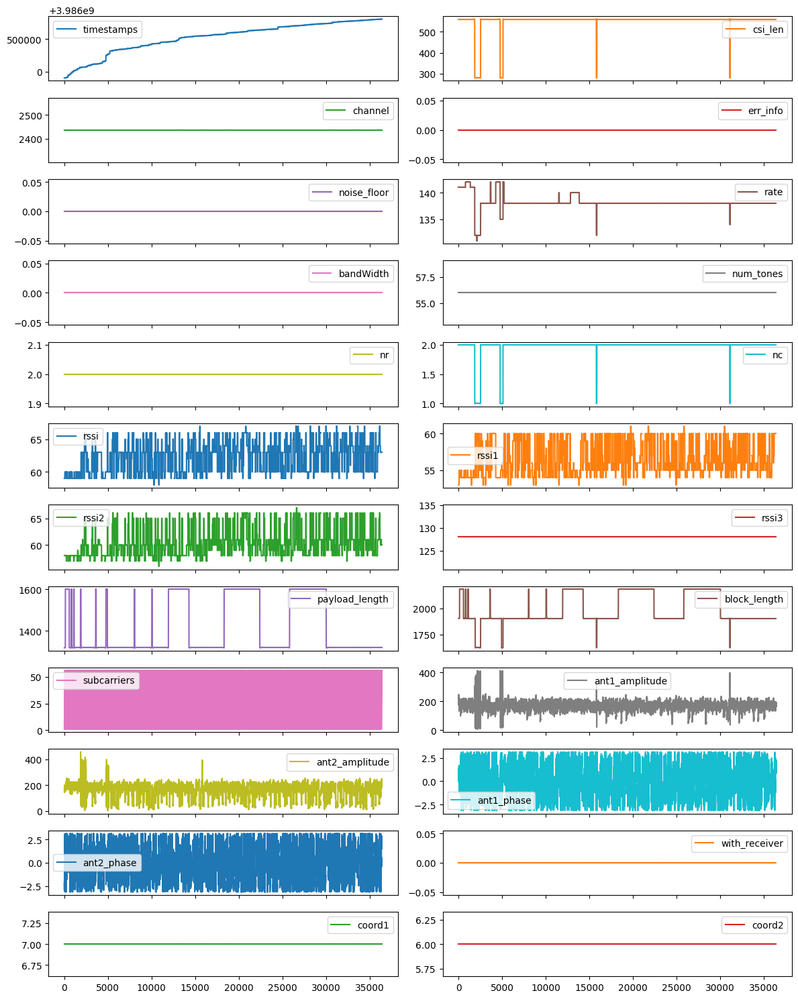

In [102]:
wo_7_6_0.plot(subplots=True, layout=(len(wo_7_6_0.columns)//2, 2), figsize=(12, 15), sharex=True)
plt.tight_layout()
plt.show()

In [103]:
wo_7_6_0.drop(columns=["coord1", "coord2", "with_receiver", "rssi3", "nr", "num_tones", "noise_floor", "channel", "err_info"], inplace=True)
wo_7_6_0.head()

,timestamps,csi_len,rate,bandWidth,nc,rssi,rssi1,rssi2,payload_length,block_length,subcarriers,ant1_amplitude,ant2_amplitude,ant1_phase,ant2_phase
0,3985903916,560,141,0,2,59,53,58,1320,1904,1,215.102301,145.838952,0.139925,-2.791650
1,3985903916,560,141,0,2,59,53,58,1320,1904,2,173.769963,153.000000,1.362115,-2.060754
2,3985903916,560,141,0,2,59,53,58,1320,1904,3,222.643212,154.029218,0.121569,-2.838320
3,3985903916,560,141,0,2,59,53,58,1320,1904,4,181.686543,157.155973,1.343172,-2.082839
4,3985903916,560,141,0,2,59,53,58,1320,1904,5,226.797266,162.640708,0.083874,-2.854847


## Amplitude

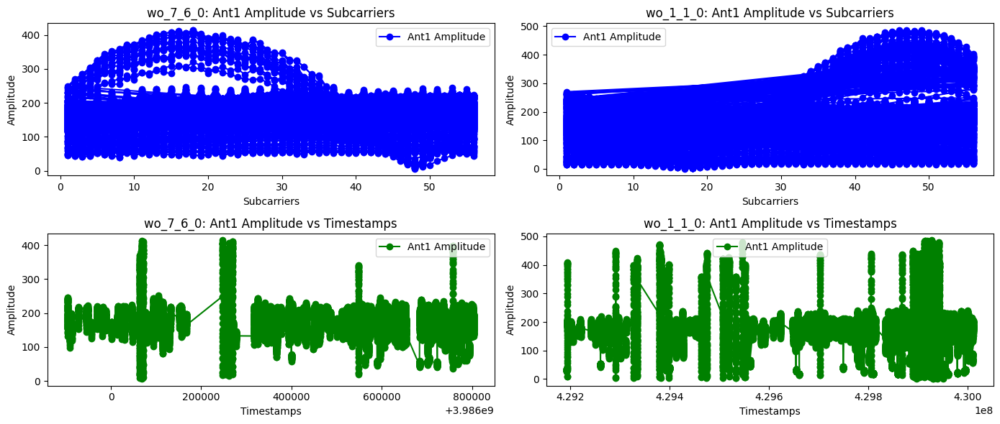

In [104]:
# Create a figure with 2x2 subplots for comparison
fig, ax = plt.subplots(2, 2, figsize=(14, 6))

# Left column (wo_7_6_0) - Ant1 Amplitude vs Subcarriers
ax[0][0].plot(wo_7_6_0["subcarriers"], wo_7_6_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='blue')
ax[0][0].set_xlabel("Subcarriers")
ax[0][0].set_ylabel("Amplitude")
ax[0][0].set_title("wo_7_6_0: Ant1 Amplitude vs Subcarriers")
ax[0][0].legend()

# Right column (wo_1_1_0) - Ant1 Amplitude vs Subcarriers
ax[0][1].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='blue')
ax[0][1].set_xlabel("Subcarriers")
ax[0][1].set_ylabel("Amplitude")
ax[0][1].set_title("wo_1_1_0: Ant1 Amplitude vs Subcarriers")
ax[0][1].legend()

# Left column (wo_7_6_0) - Ant1 Amplitude vs Timestamps
ax[1][0].plot(wo_7_6_0["timestamps"], wo_7_6_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='green')
ax[1][0].set_xlabel("Timestamps")
ax[1][0].set_ylabel("Amplitude")
ax[1][0].set_title("wo_7_6_0: Ant1 Amplitude vs Timestamps")
ax[1][0].legend()

# Right column (wo_1_1_0) - Ant1 Amplitude vs Timestamps
ax[1][1].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='green')
ax[1][1].set_xlabel("Timestamps")
ax[1][1].set_ylabel("Amplitude")
ax[1][1].set_title("wo_1_1_0: Ant1 Amplitude vs Timestamps")
ax[1][1].legend()

# Adjust layout and display
plt.tight_layout()
plt.show()

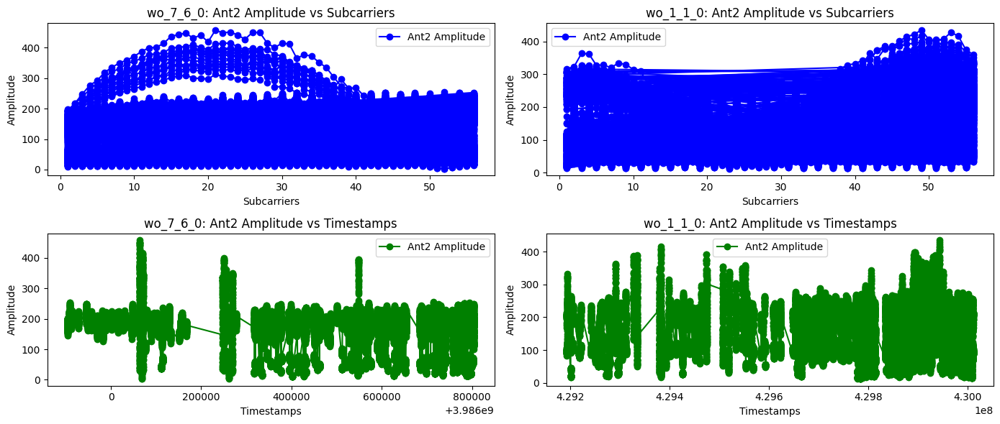

In [105]:
# Create a figure with 2x2 subplots for comparison
fig, ax = plt.subplots(2, 2, figsize=(14, 6))

# Left column (wo_7_6_0) - Ant2 Amplitude vs Subcarriers
ax[0][0].plot(wo_7_6_0["subcarriers"], wo_7_6_0["ant2_amplitude"], label="Ant2 Amplitude", marker='o', color='blue')
ax[0][0].set_xlabel("Subcarriers")
ax[0][0].set_ylabel("Amplitude")
ax[0][0].set_title("wo_7_6_0: Ant2 Amplitude vs Subcarriers")
ax[0][0].legend()

# Right column (wo_1_1_0) - Ant2 Amplitude vs Subcarriers
ax[0][1].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant2_amplitude"], label="Ant2 Amplitude", marker='o', color='blue')
ax[0][1].set_xlabel("Subcarriers")
ax[0][1].set_ylabel("Amplitude")
ax[0][1].set_title("wo_1_1_0: Ant2 Amplitude vs Subcarriers")
ax[0][1].legend()

# Left column (wo_7_6_0) - Ant2 Amplitude vs Timestamps
ax[1][0].plot(wo_7_6_0["timestamps"], wo_7_6_0["ant2_amplitude"], label="Ant2 Amplitude", marker='o', color='green')
ax[1][0].set_xlabel("Timestamps")
ax[1][0].set_ylabel("Amplitude")
ax[1][0].set_title("wo_7_6_0: Ant2 Amplitude vs Timestamps")
ax[1][0].legend()

# Right column (wo_1_1_0) - Ant2 Amplitude vs Timestamps
ax[1][1].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant2_amplitude"], label="Ant2 Amplitude", marker='o', color='green')
ax[1][1].set_xlabel("Timestamps")
ax[1][1].set_ylabel("Amplitude")
ax[1][1].set_title("wo_1_1_0: Ant2 Amplitude vs Timestamps")
ax[1][1].legend()

# Adjust layout and display
plt.tight_layout()
plt.show()

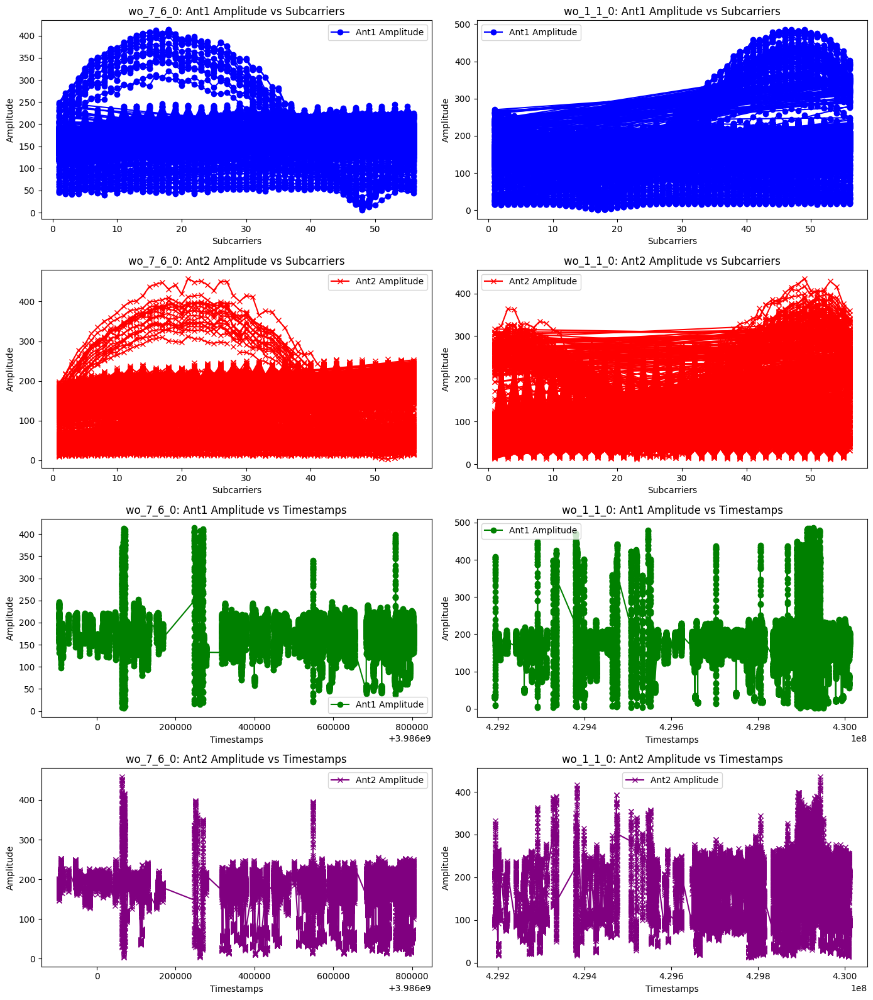

In [106]:
# Create a figure with 4 rows and 2 columns for comparison
fig, ax = plt.subplots(4, 2, figsize=(14, 16))

# First row: Ant1 Amplitude vs Subcarriers
# Left column: wo_7_6_0 Ant1 Amplitude vs Subcarriers
ax[0][0].plot(wo_7_6_0["subcarriers"], wo_7_6_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='blue')
ax[0][0].set_xlabel("Subcarriers")
ax[0][0].set_ylabel("Amplitude")
ax[0][0].set_title("wo_7_6_0: Ant1 Amplitude vs Subcarriers")
ax[0][0].legend()

# Right column: wo_1_1_0 Ant1 Amplitude vs Subcarriers
ax[0][1].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='blue')
ax[0][1].set_xlabel("Subcarriers")
ax[0][1].set_ylabel("Amplitude")
ax[0][1].set_title("wo_1_1_0: Ant1 Amplitude vs Subcarriers")
ax[0][1].legend()

# Second row: Ant2 Amplitude vs Subcarriers
# Left column: wo_7_6_0 Ant2 Amplitude vs Subcarriers
ax[1][0].plot(wo_7_6_0["subcarriers"], wo_7_6_0["ant2_amplitude"], label="Ant2 Amplitude", marker='x', color='red')
ax[1][0].set_xlabel("Subcarriers")
ax[1][0].set_ylabel("Amplitude")
ax[1][0].set_title("wo_7_6_0: Ant2 Amplitude vs Subcarriers")
ax[1][0].legend()

# Right column: wo_1_1_0 Ant2 Amplitude vs Subcarriers
ax[1][1].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant2_amplitude"], label="Ant2 Amplitude", marker='x', color='red')
ax[1][1].set_xlabel("Subcarriers")
ax[1][1].set_ylabel("Amplitude")
ax[1][1].set_title("wo_1_1_0: Ant2 Amplitude vs Subcarriers")
ax[1][1].legend()

# Third row: Ant1 Amplitude vs Timestamps
# Left column: wo_7_6_0 Ant1 Amplitude vs Timestamps
ax[2][0].plot(wo_7_6_0["timestamps"], wo_7_6_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='green')
ax[2][0].set_xlabel("Timestamps")
ax[2][0].set_ylabel("Amplitude")
ax[2][0].set_title("wo_7_6_0: Ant1 Amplitude vs Timestamps")
ax[2][0].legend()

# Right column: wo_1_1_0 Ant1 Amplitude vs Timestamps
ax[2][1].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='green')
ax[2][1].set_xlabel("Timestamps")
ax[2][1].set_ylabel("Amplitude")
ax[2][1].set_title("wo_1_1_0: Ant1 Amplitude vs Timestamps")
ax[2][1].legend()

# Fourth row: Ant2 Amplitude vs Timestamps
# Left column: wo_7_6_0 Ant2 Amplitude vs Timestamps
ax[3][0].plot(wo_7_6_0["timestamps"], wo_7_6_0["ant2_amplitude"], label="Ant2 Amplitude", marker='x', color='purple')
ax[3][0].set_xlabel("Timestamps")
ax[3][0].set_ylabel("Amplitude")
ax[3][0].set_title("wo_7_6_0: Ant2 Amplitude vs Timestamps")
ax[3][0].legend()

# Right column: wo_1_1_0 Ant2 Amplitude vs Timestamps
ax[3][1].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant2_amplitude"], label="Ant2 Amplitude", marker='x', color='purple')
ax[3][1].set_xlabel("Timestamps")
ax[3][1].set_ylabel("Amplitude")
ax[3][1].set_title("wo_1_1_0: Ant2 Amplitude vs Timestamps")
ax[3][1].legend()

# Adjust layout and display
plt.tight_layout()
plt.show()


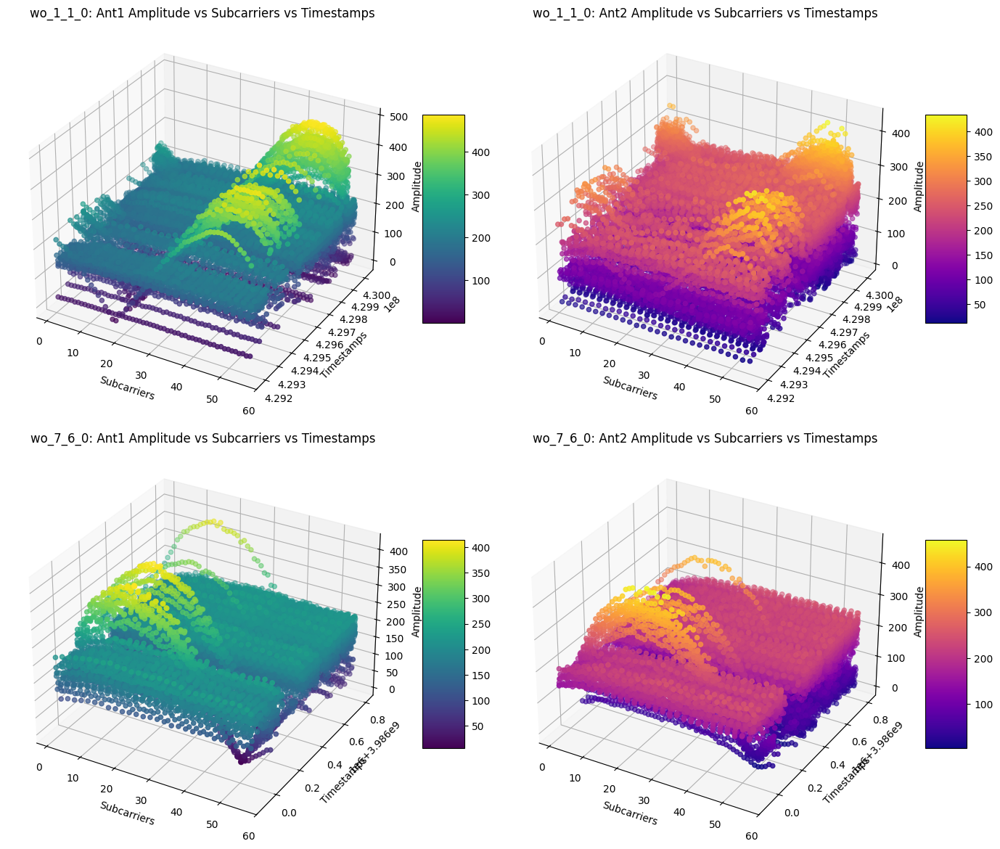

In [107]:

# Create a figure with 2x2 subplots for 3D scatter plots
fig = plt.figure(figsize=(14, 12))

# First subplot (top-left) for wo_1_1_0 Ant1 Amplitude
ax1 = fig.add_subplot(221, projection='3d')
subcarriers_1_1_0 = wo_1_1_0["subcarriers"]
amplitude_ant1_1_1_0 = wo_1_1_0["ant1_amplitude"]
timestamps_1_1_0 = wo_1_1_0["timestamps"]

# 3D scatter plot for wo_1_1_0 Ant1
scatter1 = ax1.scatter(subcarriers_1_1_0, timestamps_1_1_0, amplitude_ant1_1_1_0, c=amplitude_ant1_1_1_0, cmap='viridis')
ax1.set_xlabel('Subcarriers')
ax1.set_ylabel('Timestamps')
ax1.set_zlabel('Amplitude')
ax1.set_title('wo_1_1_0: Ant1 Amplitude vs Subcarriers vs Timestamps')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot (top-right) for wo_1_1_0 Ant2 Amplitude
ax2 = fig.add_subplot(222, projection='3d')
amplitude_ant2_1_1_0 = wo_1_1_0["ant2_amplitude"]

# 3D scatter plot for wo_1_1_0 Ant2
scatter2 = ax2.scatter(subcarriers_1_1_0, timestamps_1_1_0, amplitude_ant2_1_1_0, c=amplitude_ant2_1_1_0, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Amplitude')
ax2.set_title('wo_1_1_0: Ant2 Amplitude vs Subcarriers vs Timestamps')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Third subplot (bottom-left) for wo_7_6_0 Ant1 Amplitude
ax3 = fig.add_subplot(223, projection='3d')
subcarriers_7_6_0 = wo_7_6_0["subcarriers"]
amplitude_ant1_7_6_0 = wo_7_6_0["ant1_amplitude"]
timestamps_7_6_0 = wo_7_6_0["timestamps"]

# 3D scatter plot for wo_7_6_0 Ant1
scatter3 = ax3.scatter(subcarriers_7_6_0, timestamps_7_6_0, amplitude_ant1_7_6_0, c=amplitude_ant1_7_6_0, cmap='viridis')
ax3.set_xlabel('Subcarriers')
ax3.set_ylabel('Timestamps')
ax3.set_zlabel('Amplitude')
ax3.set_title('wo_7_6_0: Ant1 Amplitude vs Subcarriers vs Timestamps')
fig.colorbar(scatter3, ax=ax3, shrink=0.5, aspect=5)

# Fourth subplot (bottom-right) for wo_7_6_0 Ant2 Amplitude
ax4 = fig.add_subplot(224, projection='3d')
amplitude_ant2_7_6_0 = wo_7_6_0["ant2_amplitude"]

# 3D scatter plot for wo_7_6_0 Ant2
scatter4 = ax4.scatter(subcarriers_7_6_0, timestamps_7_6_0, amplitude_ant2_7_6_0, c=amplitude_ant2_7_6_0, cmap='plasma')
ax4.set_xlabel('Subcarriers')
ax4.set_ylabel('Timestamps')
ax4.set_zlabel('Amplitude')
ax4.set_title('wo_7_6_0: Ant2 Amplitude vs Subcarriers vs Timestamps')
fig.colorbar(scatter4, ax=ax4, shrink=0.5, aspect=5)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

## Phase

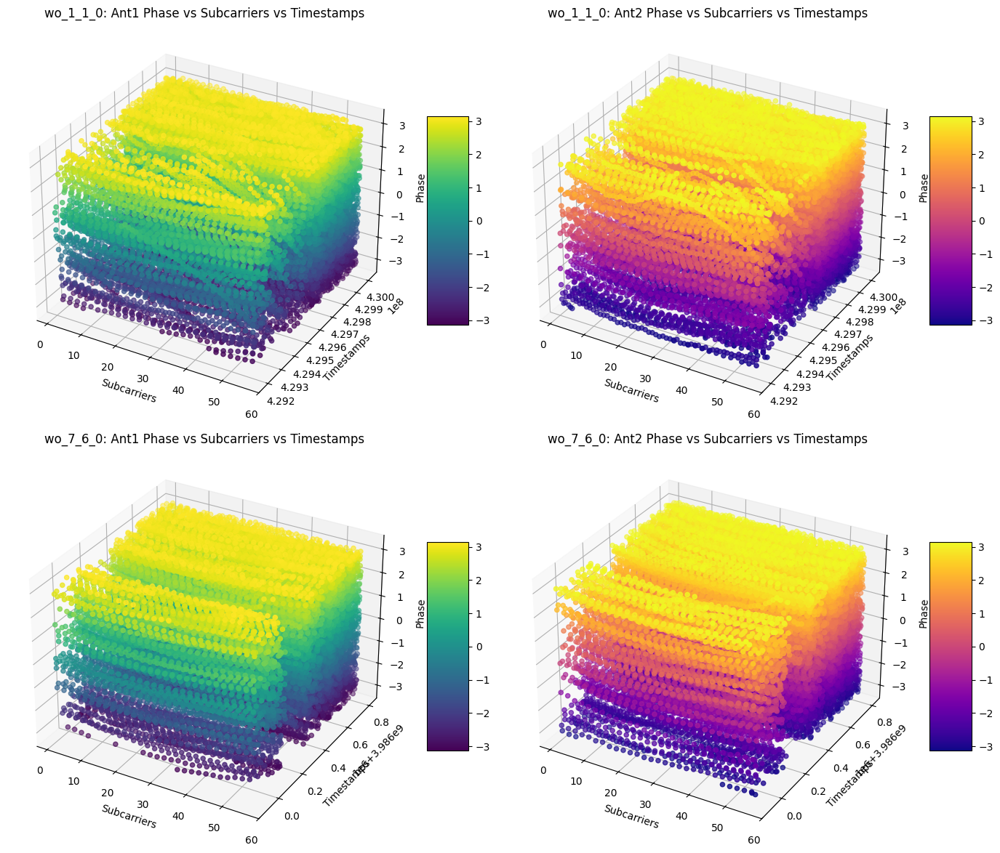

In [108]:
# Create a figure with 2x2 subplots for 3D scatter plots
fig = plt.figure(figsize=(14, 12))

# First subplot (top-left) for wo_1_1_0 Ant1 Phase
ax1 = fig.add_subplot(221, projection='3d')
subcarriers_1_1_0 = wo_1_1_0["subcarriers"]
phase_ant1_1_1_0 = wo_1_1_0["ant1_phase"]
timestamps_1_1_0 = wo_1_1_0["timestamps"]

# 3D scatter plot for wo_1_1_0 Ant1 Phase
scatter1 = ax1.scatter(subcarriers_1_1_0, timestamps_1_1_0, phase_ant1_1_1_0, c=phase_ant1_1_1_0, cmap='viridis')
ax1.set_xlabel('Subcarriers')
ax1.set_ylabel('Timestamps')
ax1.set_zlabel('Phase')
ax1.set_title('wo_1_1_0: Ant1 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot (top-right) for wo_1_1_0 Ant2 Phase
ax2 = fig.add_subplot(222, projection='3d')
phase_ant2_1_1_0 = wo_1_1_0["ant2_phase"]

# 3D scatter plot for wo_1_1_0 Ant2 Phase
scatter2 = ax2.scatter(subcarriers_1_1_0, timestamps_1_1_0, phase_ant2_1_1_0, c=phase_ant2_1_1_0, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Phase')
ax2.set_title('wo_1_1_0: Ant2 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Third subplot (bottom-left) for wo_7_6_0 Ant1 Phase
ax3 = fig.add_subplot(223, projection='3d')
subcarriers_7_6_0 = wo_7_6_0["subcarriers"]
phase_ant1_7_6_0 = wo_7_6_0["ant1_phase"]
timestamps_7_6_0 = wo_7_6_0["timestamps"]

# 3D scatter plot for wo_7_6_0 Ant1 Phase
scatter3 = ax3.scatter(subcarriers_7_6_0, timestamps_7_6_0, phase_ant1_7_6_0, c=phase_ant1_7_6_0, cmap='viridis')
ax3.set_xlabel('Subcarriers')
ax3.set_ylabel('Timestamps')
ax3.set_zlabel('Phase')
ax3.set_title('wo_7_6_0: Ant1 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter3, ax=ax3, shrink=0.5, aspect=5)

# Fourth subplot (bottom-right) for wo_7_6_0 Ant2 Phase
ax4 = fig.add_subplot(224, projection='3d')
phase_ant2_7_6_0 = wo_7_6_0["ant2_phase"]

# 3D scatter plot for wo_7_6_0 Ant2 Phase
scatter4 = ax4.scatter(subcarriers_7_6_0, timestamps_7_6_0, phase_ant2_7_6_0, c=phase_ant2_7_6_0, cmap='plasma')
ax4.set_xlabel('Subcarriers')
ax4.set_ylabel('Timestamps')
ax4.set_zlabel('Phase')
ax4.set_title('wo_7_6_0: Ant2 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter4, ax=ax4, shrink=0.5, aspect=5)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

## RSSI

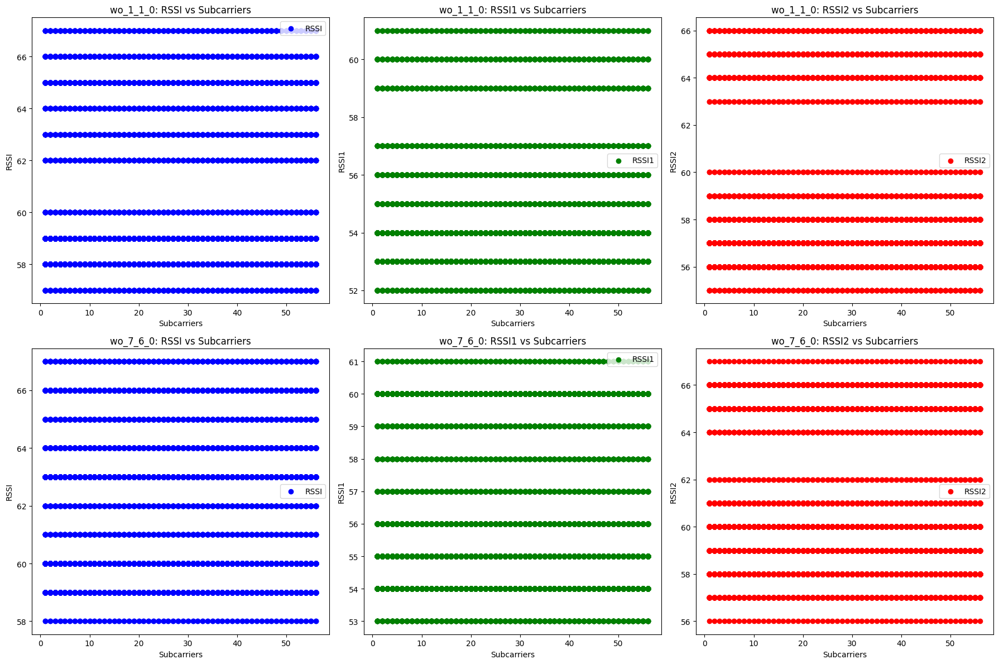

In [109]:
# Create a figure with 2 rows and 3 columns for comparison
fig, ax = plt.subplots(2, 3, figsize=(18, 12))

# Top row: wo_1_1_0 dataset

# Plot RSSI vs Subcarriers in the first subplot (top-left)
ax[0][0].scatter(wo_1_1_0["subcarriers"], wo_1_1_0["rssi"], color='blue', label="RSSI")
ax[0][0].set_xlabel('Subcarriers')
ax[0][0].set_ylabel('RSSI')
ax[0][0].set_title('wo_1_1_0: RSSI vs Subcarriers')
ax[0][0].legend()

# Plot RSSI1 vs Subcarriers in the second subplot (top-middle)
ax[0][1].scatter(wo_1_1_0["subcarriers"], wo_1_1_0["rssi1"], color='green', label="RSSI1")
ax[0][1].set_xlabel('Subcarriers')
ax[0][1].set_ylabel('RSSI1')
ax[0][1].set_title('wo_1_1_0: RSSI1 vs Subcarriers')
ax[0][1].legend()

# Plot RSSI2 vs Subcarriers in the third subplot (top-right)
ax[0][2].scatter(wo_1_1_0["subcarriers"], wo_1_1_0["rssi2"], color='red', label="RSSI2")
ax[0][2].set_xlabel('Subcarriers')
ax[0][2].set_ylabel('RSSI2')
ax[0][2].set_title('wo_1_1_0: RSSI2 vs Subcarriers')
ax[0][2].legend()

# Bottom row: wo_7_6_0 dataset

# Plot RSSI vs Subcarriers in the first subplot (bottom-left)
ax[1][0].scatter(wo_7_6_0["subcarriers"], wo_7_6_0["rssi"], color='blue', label="RSSI")
ax[1][0].set_xlabel('Subcarriers')
ax[1][0].set_ylabel('RSSI')
ax[1][0].set_title('wo_7_6_0: RSSI vs Subcarriers')
ax[1][0].legend()

# Plot RSSI1 vs Subcarriers in the second subplot (bottom-middle)
ax[1][1].scatter(wo_7_6_0["subcarriers"], wo_7_6_0["rssi1"], color='green', label="RSSI1")
ax[1][1].set_xlabel('Subcarriers')
ax[1][1].set_ylabel('RSSI1')
ax[1][1].set_title('wo_7_6_0: RSSI1 vs Subcarriers')
ax[1][1].legend()

# Plot RSSI2 vs Subcarriers in the third subplot (bottom-right)
ax[1][2].scatter(wo_7_6_0["subcarriers"], wo_7_6_0["rssi2"], color='red', label="RSSI2")
ax[1][2].set_xlabel('Subcarriers')
ax[1][2].set_ylabel('RSSI2')
ax[1][2].set_title('wo_7_6_0: RSSI2 vs Subcarriers')
ax[1][2].legend()

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

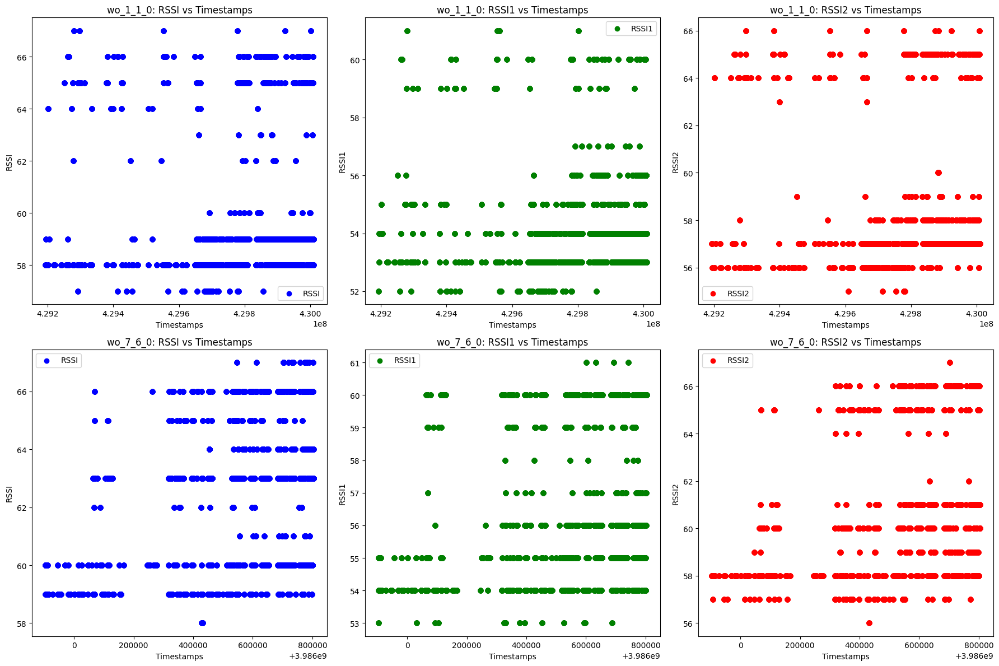

In [110]:
# Create a figure with 2 rows and 3 columns for comparison
fig, ax = plt.subplots(2, 3, figsize=(18, 12))

# Top row: wo_1_1_0 dataset

# Plot RSSI vs Timestamps in the first subplot (top-left)
ax[0][0].scatter(wo_1_1_0["timestamps"], wo_1_1_0["rssi"], color='blue', label="RSSI")
ax[0][0].set_xlabel('Timestamps')
ax[0][0].set_ylabel('RSSI')
ax[0][0].set_title('wo_1_1_0: RSSI vs Timestamps')
ax[0][0].legend()

# Plot RSSI1 vs Timestamps in the second subplot (top-middle)
ax[0][1].scatter(wo_1_1_0["timestamps"], wo_1_1_0["rssi1"], color='green', label="RSSI1")
ax[0][1].set_xlabel('Timestamps')
ax[0][1].set_ylabel('RSSI1')
ax[0][1].set_title('wo_1_1_0: RSSI1 vs Timestamps')
ax[0][1].legend()

# Plot RSSI2 vs Timestamps in the third subplot (top-right)
ax[0][2].scatter(wo_1_1_0["timestamps"], wo_1_1_0["rssi2"], color='red', label="RSSI2")
ax[0][2].set_xlabel('Timestamps')
ax[0][2].set_ylabel('RSSI2')
ax[0][2].set_title('wo_1_1_0: RSSI2 vs Timestamps')
ax[0][2].legend()

# Bottom row: wo_7_6_0 dataset

# Plot RSSI vs Timestamps in the first subplot (bottom-left)
ax[1][0].scatter(wo_7_6_0["timestamps"], wo_7_6_0["rssi"], color='blue', label="RSSI")
ax[1][0].set_xlabel('Timestamps')
ax[1][0].set_ylabel('RSSI')
ax[1][0].set_title('wo_7_6_0: RSSI vs Timestamps')
ax[1][0].legend()

# Plot RSSI1 vs Timestamps in the second subplot (bottom-middle)
ax[1][1].scatter(wo_7_6_0["timestamps"], wo_7_6_0["rssi1"], color='green', label="RSSI1")
ax[1][1].set_xlabel('Timestamps')
ax[1][1].set_ylabel('RSSI1')
ax[1][1].set_title('wo_7_6_0: RSSI1 vs Timestamps')
ax[1][1].legend()

# Plot RSSI2 vs Timestamps in the third subplot (bottom-right)
ax[1][2].scatter(wo_7_6_0["timestamps"], wo_7_6_0["rssi2"], color='red', label="RSSI2")
ax[1][2].set_xlabel('Timestamps')
ax[1][2].set_ylabel('RSSI2')
ax[1][2].set_title('wo_7_6_0: RSSI2 vs Timestamps')
ax[1][2].legend()

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

# Filter

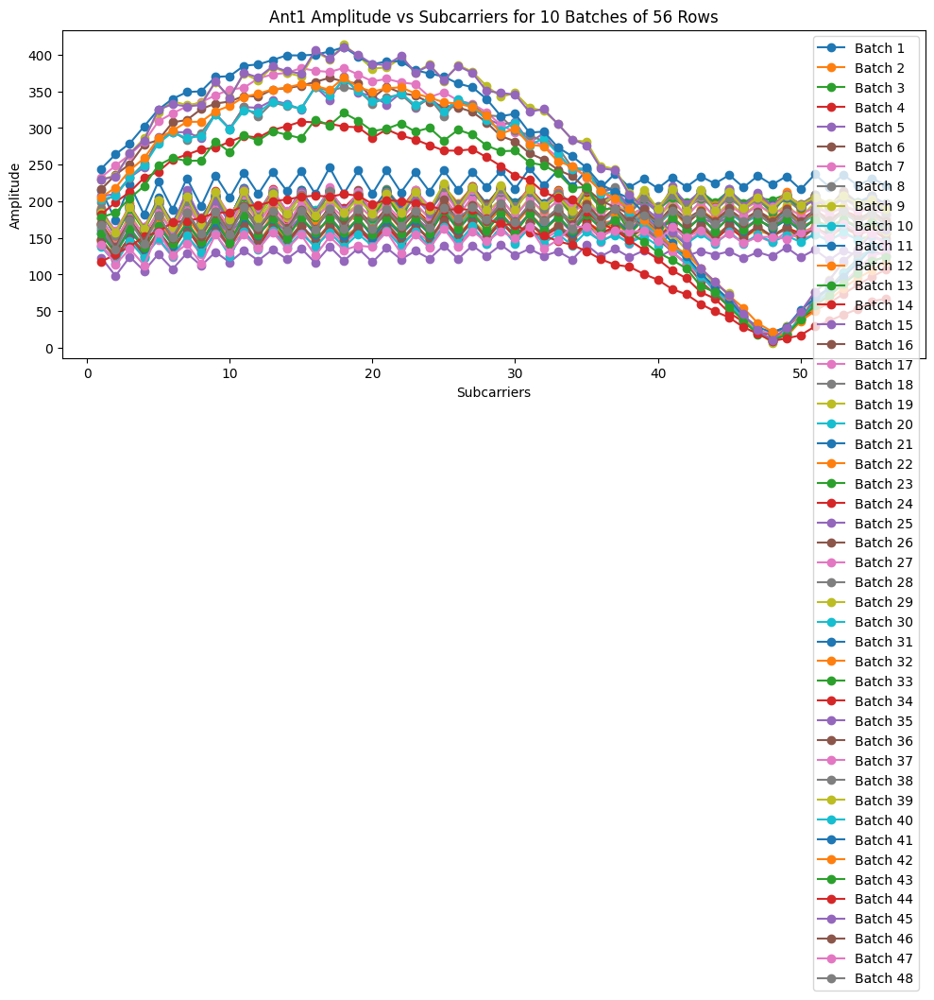

In [111]:
plt.figure(figsize=(10, 8))

# Plot 10 graphs, each containing 56 rows of data
for i in range(48):
    start = i * 56
    end = start + 56
    subcarriers_batch = wo_7_6_0["subcarriers"][start:end]
    amplitude_batch = wo_7_6_0["ant1_amplitude"][start:end]
    
    plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i+1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Ant1 Amplitude vs Subcarriers for 10 Batches of 56 Rows")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

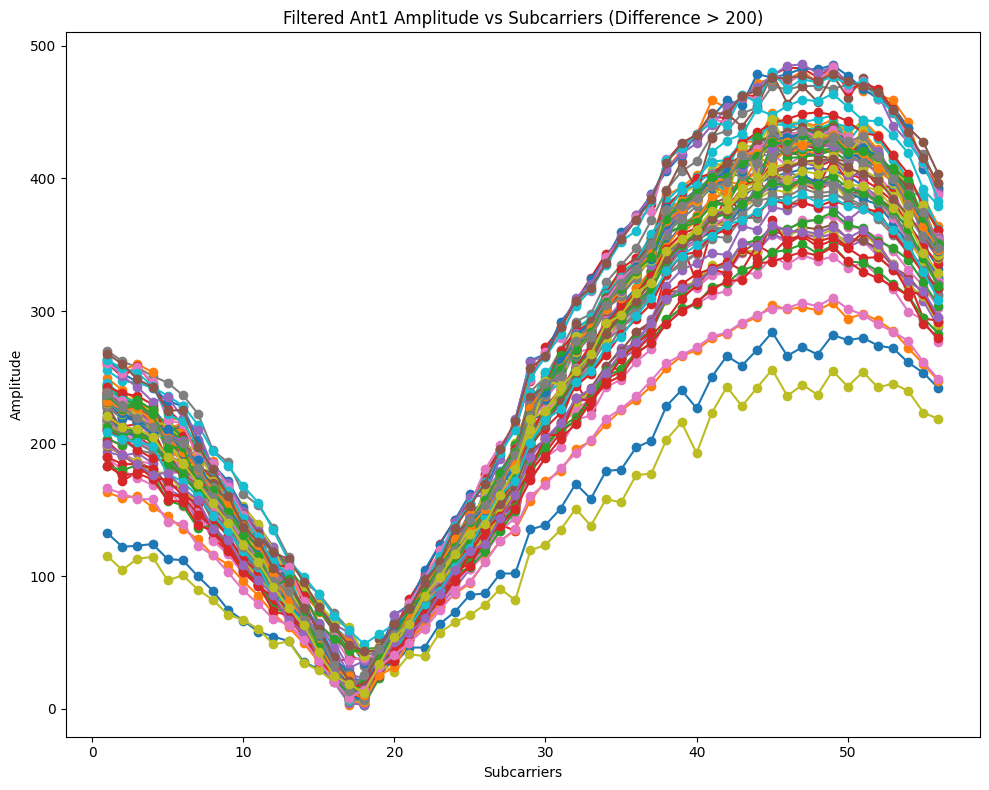

In [112]:
plt.figure(figsize=(10, 8))

# Loop through batches of 56 rows
for i in range(len(wo_1_1_0) // 56):
    start = i * 56
    end = start + 56
    subcarriers_batch = wo_1_1_0["subcarriers"][start:end]
    amplitude_batch = wo_1_1_0["ant1_amplitude"][start:end]
    
    # Calculate the difference between maximum and minimum amplitude in the batch
    amplitude_range = amplitude_batch.max() - amplitude_batch.min()
    
    # Filter: only plot batches where the difference is larger than 200
    if amplitude_range >= 100:
        plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i+1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Filtered Ant1 Amplitude vs Subcarriers (Difference > 200)")
# plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

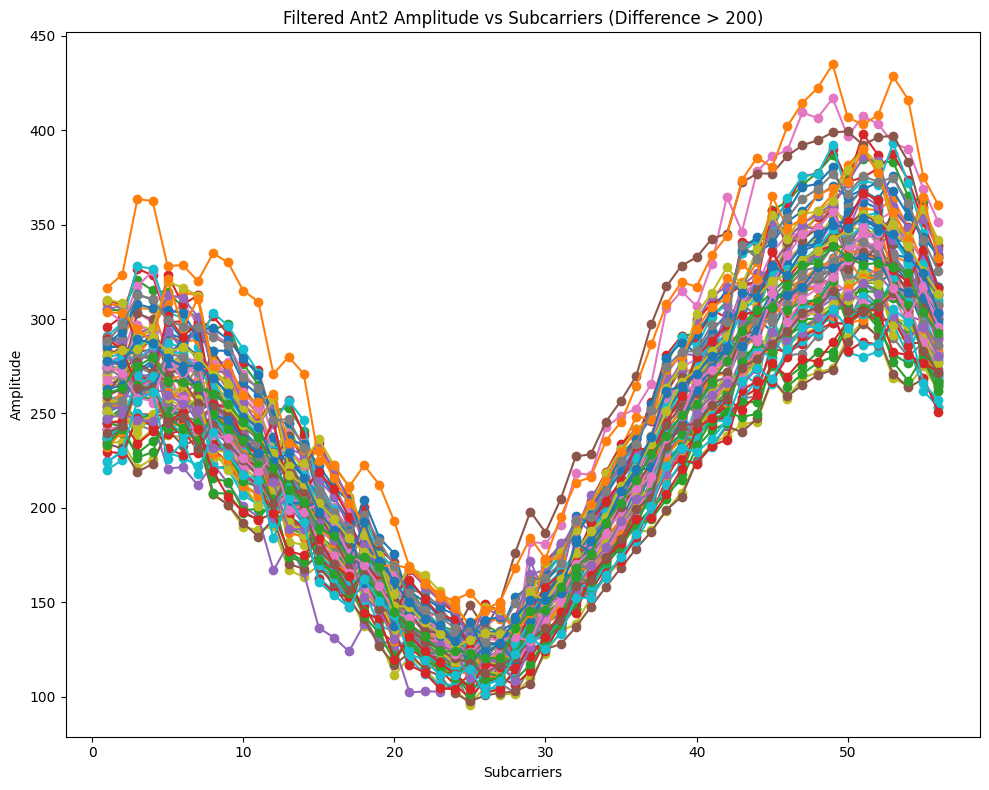

In [113]:
plt.figure(figsize=(10, 8))

# Loop through batches of 56 rows
for i in range(len(wo_1_1_0) // 56):
    start = i * 56
    end = start + 56
    subcarriers_batch = wo_1_1_0["subcarriers"][start:end]
    amplitude_batch = wo_1_1_0["ant2_amplitude"][start:end]
    
    # Calculate the difference between maximum and minimum amplitude in the batch
    amplitude_range = amplitude_batch.max() - amplitude_batch.min()
    
    # Filter: only plot batches where the difference is larger than 200
    if amplitude_range >= 200:
        plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i+1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Filtered Ant2 Amplitude vs Subcarriers (Difference > 200)")
# plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

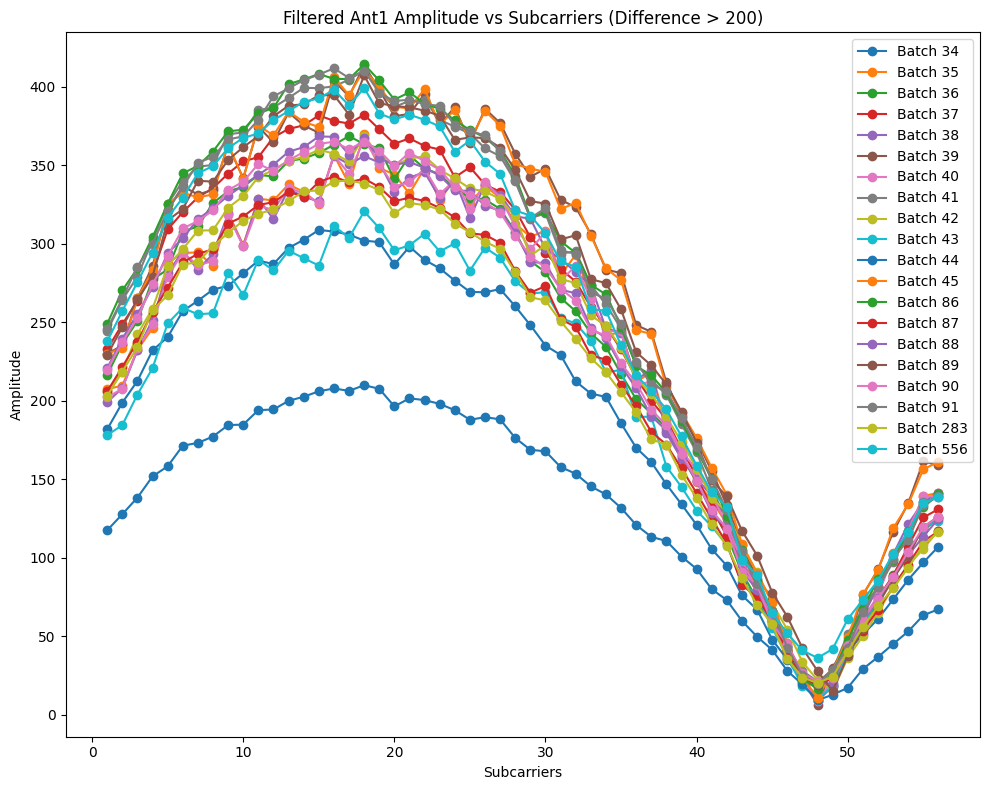

In [114]:
plt.figure(figsize=(10, 8))

# Loop through batches of 56 rows
for i in range(len(wo_7_6_0) // 56):
    start = i * 56
    end = start + 56
    subcarriers_batch = wo_7_6_0["subcarriers"][start:end]
    amplitude_batch = wo_7_6_0["ant1_amplitude"][start:end]
    
    # Calculate the difference between maximum and minimum amplitude in the batch
    amplitude_range = amplitude_batch.max() - amplitude_batch.min()
    
    # Filter: only plot batches where the difference is larger than 200
    if amplitude_range >= 100:
        plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i+1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Filtered Ant1 Amplitude vs Subcarriers (Difference > 200)")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

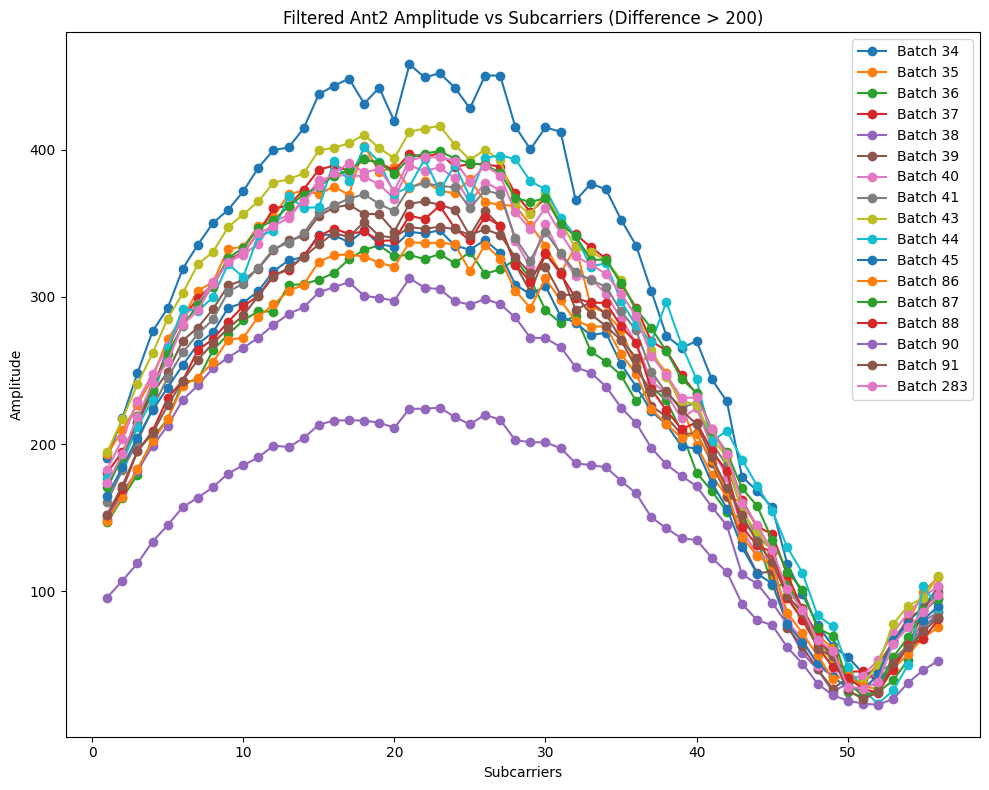

In [115]:
plt.figure(figsize=(10, 8))

# Loop through batches of 56 rows
for i in range(len(wo_7_6_0) // 56):
    start = i * 56
    end = start + 56
    subcarriers_batch = wo_7_6_0["subcarriers"][start:end]
    amplitude_batch = wo_7_6_0["ant2_amplitude"][start:end]
    
    # Calculate the difference between maximum and minimum amplitude in the batch
    amplitude_range = amplitude_batch.max() - amplitude_batch.min()
    
    # Filter: only plot batches where the difference is larger than 200
    if amplitude_range >= 200:
        plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i+1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Filtered Ant2 Amplitude vs Subcarriers (Difference > 200)")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

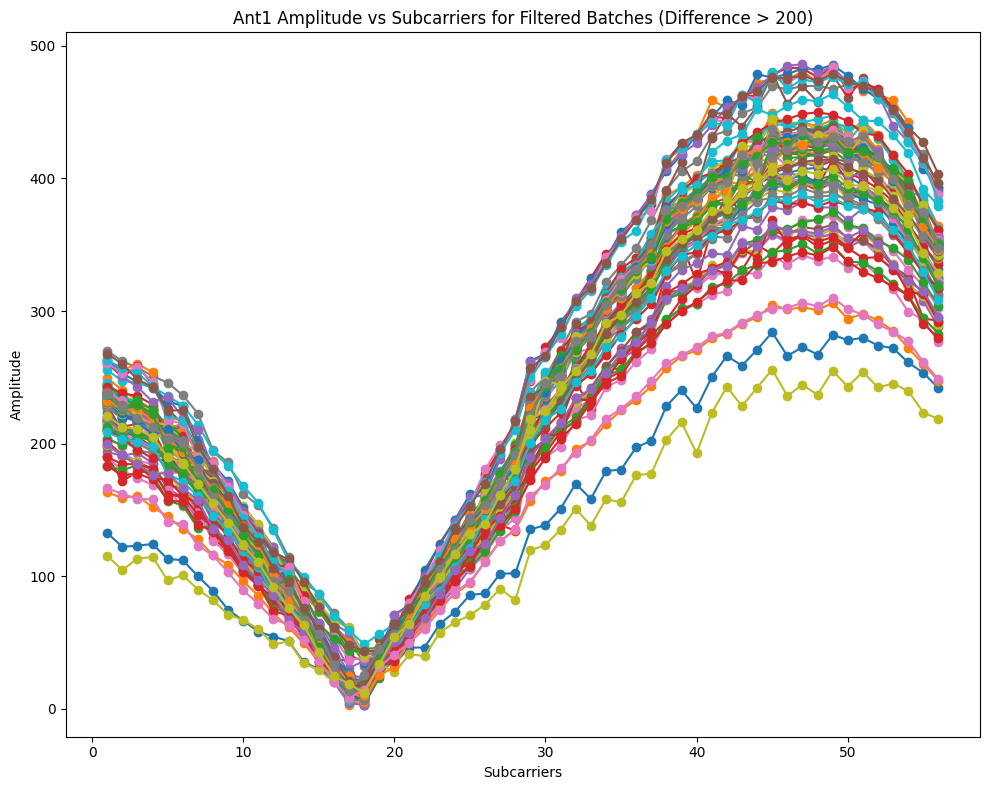

In [116]:
# Create an empty DataFrame to hold the valid batches
valid_batches_df_ant1 = pd.DataFrame()

# Loop through batches of 56 rows
for i in range(len(wo_1_1_0) // 56):
    start = i * 56
    end = start + 56
    
    # Extract the full batch (all columns)
    batch = wo_1_1_0.iloc[start:end]
    
    # Calculate the difference between maximum and minimum amplitude in the batch
    amplitude_range = batch["ant1_amplitude"].max() - batch["ant1_amplitude"].min()
    
    # Filter: only keep batches where the difference is larger than 200
    if amplitude_range >= 100:
        # Append valid batches to the DataFrame
        valid_batches_df_ant1 = pd.concat([valid_batches_df_ant1, batch], ignore_index=True)

# Now valid_batches_df contains all rows where the condition is met.
# You can now work with the full dataset or visualize it.

# Example: plotting Ant1 Amplitude vs Subcarriers for the filtered batches
plt.figure(figsize=(10, 8))

for i in range(0, len(valid_batches_df_ant1), 56):
    subcarriers_batch = valid_batches_df_ant1["subcarriers"][i:i+56]
    amplitude_batch = valid_batches_df_ant1["ant1_amplitude"][i:i+56]
    
    plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i//56 + 1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Ant1 Amplitude vs Subcarriers for Filtered Batches (Difference > 200)")
# plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [117]:
valid_batches_df_ant1.head()

,timestamps,csi_len,rate,bandWidth,nc,rssi,rssi1,rssi2,payload_length,block_length,subcarriers,ant1_amplitude,ant2_amplitude,ant1_phase,ant2_phase
0,429193757,280,133,0,1,59,54,57,1320,1624,1,223.020178,250.936247,-0.013452,-2.783288
1,429193757,280,133,0,1,59,54,57,1320,1624,2,212.275764,253.938969,-0.146561,-2.890883
2,429193757,280,133,0,1,59,54,57,1320,1624,3,207.624661,272.016544,-0.233297,-2.949244
3,429193757,280,133,0,1,59,54,57,1320,1624,4,202.141040,275.960142,-0.348348,-3.058150
4,429193757,280,133,0,1,59,54,57,1320,1624,5,191.426226,259.113875,-0.477665,3.048836


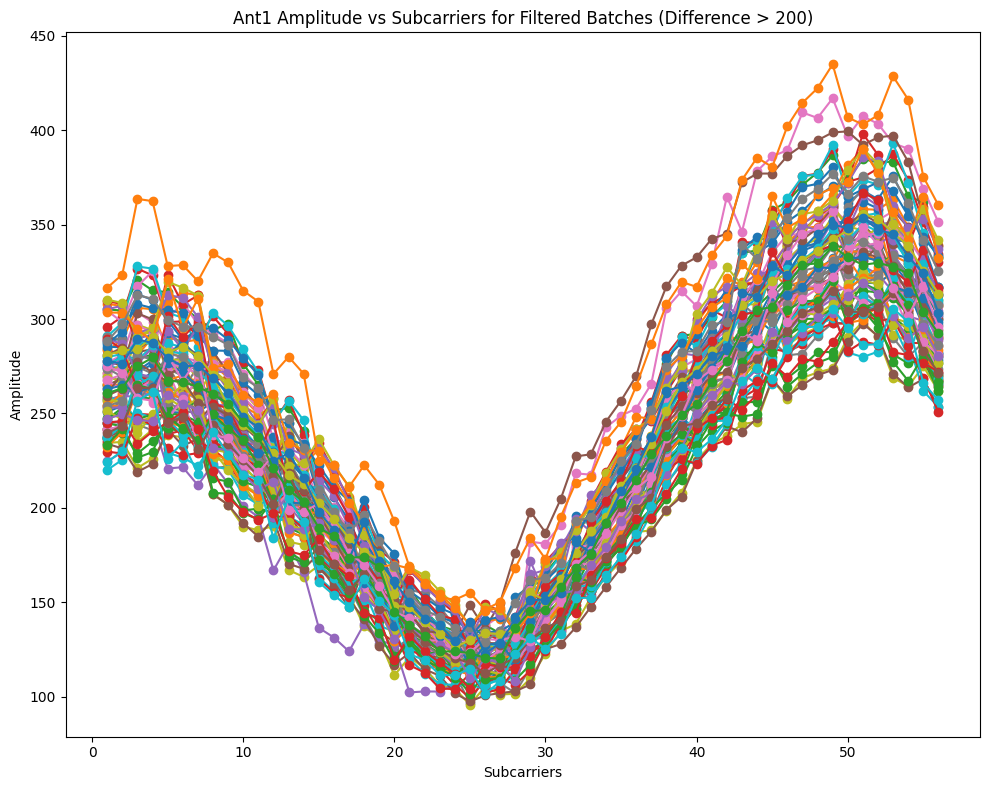

In [118]:
# Create an empty DataFrame to hold the valid batches
valid_batches_df_ant2 = pd.DataFrame()

# Loop through batches of 56 rows
for i in range(len(wo_1_1_0) // 56):
    start = i * 56
    end = start + 56
    
    # Extract the full batch (all columns)
    batch = wo_1_1_0.iloc[start:end]
    
    # Calculate the difference between maximum and minimum amplitude in the batch
    amplitude_range = batch["ant2_amplitude"].max() - batch["ant2_amplitude"].min()
    
    # Filter: only keep batches where the difference is larger than 200
    if amplitude_range >= 200:
        # Append valid batches to the DataFrame
        valid_batches_df_ant2 = pd.concat([valid_batches_df_ant2, batch], ignore_index=True)

# Now valid_batches_df contains all rows where the condition is met.
# You can now work with the full dataset or visualize it.

# Example: plotting Ant1 Amplitude vs Subcarriers for the filtered batches
plt.figure(figsize=(10, 8))

for i in range(0, len(valid_batches_df_ant2), 56):
    subcarriers_batch = valid_batches_df_ant2["subcarriers"][i:i+56]
    amplitude_batch = valid_batches_df_ant2["ant2_amplitude"][i:i+56]
    
    plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i//56 + 1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Ant1 Amplitude vs Subcarriers for Filtered Batches (Difference > 200)")
# plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [119]:
valid_batches_df_ant2.head()

,timestamps,csi_len,rate,bandWidth,nc,rssi,rssi1,rssi2,payload_length,block_length,subcarriers,ant1_amplitude,ant2_amplitude,ant1_phase,ant2_phase
0,429193757,280,133,0,1,59,54,57,1320,1624,1,223.020178,250.936247,-0.013452,-2.783288
1,429193757,280,133,0,1,59,54,57,1320,1624,2,212.275764,253.938969,-0.146561,-2.890883
2,429193757,280,133,0,1,59,54,57,1320,1624,3,207.624661,272.016544,-0.233297,-2.949244
3,429193757,280,133,0,1,59,54,57,1320,1624,4,202.141040,275.960142,-0.348348,-3.058150
4,429193757,280,133,0,1,59,54,57,1320,1624,5,191.426226,259.113875,-0.477665,3.048836


## NC == 1

In [120]:
wo_1_1_0_nc_1 = wo_1_1_0[wo_1_1_0['nc'] == 1]
wo_1_1_0_nc_1.head()

,timestamps,csi_len,rate,bandWidth,nc,rssi,rssi1,rssi2,payload_length,block_length,subcarriers,ant1_amplitude,ant2_amplitude,ant1_phase,ant2_phase
112,429193757,280,133,0,1,59,54,57,1320,1624,1,223.020178,250.936247,-0.013452,-2.783288
113,429193757,280,133,0,1,59,54,57,1320,1624,2,212.275764,253.938969,-0.146561,-2.890883
114,429193757,280,133,0,1,59,54,57,1320,1624,3,207.624661,272.016544,-0.233297,-2.949244
115,429193757,280,133,0,1,59,54,57,1320,1624,4,202.141040,275.960142,-0.348348,-3.058150
116,429193757,280,133,0,1,59,54,57,1320,1624,5,191.426226,259.113875,-0.477665,3.048836


In [121]:
wo_7_6_0_nc_1 = wo_7_6_0[wo_7_6_0['nc'] == 1]
wo_7_6_0_nc_1.head()

,timestamps,csi_len,rate,bandWidth,nc,rssi,rssi1,rssi2,payload_length,block_length,subcarriers,ant1_amplitude,ant2_amplitude,ant1_phase,ant2_phase
1848,3986063507,280,132,0,1,59,54,57,1600,1904,1,181.727818,190.436341,2.076291,-1.222474
1849,3986063507,280,132,0,1,59,54,57,1600,1904,2,198.708329,217.720004,1.996174,-1.286818
1850,3986063507,280,132,0,1,59,54,57,1600,1904,3,212.565284,248.294180,1.916352,-1.363922
1851,3986063507,280,132,0,1,59,54,57,1600,1904,4,232.002155,276.622486,1.850280,-1.432989
1852,3986063507,280,132,0,1,59,54,57,1600,1904,5,240.441261,292.335424,1.763298,-1.522888


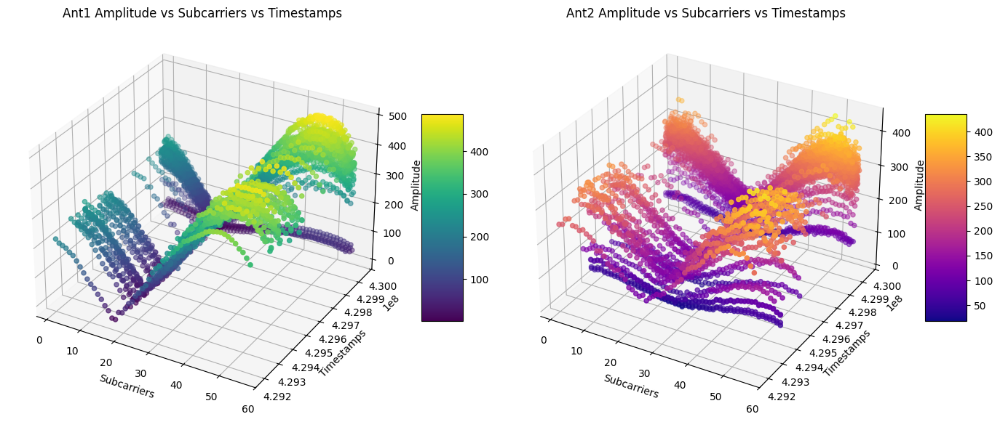

In [122]:
# Create a figure with two subplots for side-by-side 3D scatter plots
fig = plt.figure(figsize=(14, 6))

# First subplot for Ant1 Amplitude
ax1 = fig.add_subplot(121, projection='3d')
subcarriers = wo_1_1_0_nc_1["subcarriers"]
amplitude_ant1 = wo_1_1_0_nc_1["ant1_amplitude"]
timestamps = wo_1_1_0_nc_1["timestamps"]

# 3D scatter plot for Ant1
# scatter1 = ax1.scatter(subcarriers, timestamps, amplitude_ant1, c=amplitude_ant1, cmap='viridis')
scatter1 = ax1.scatter(subcarriers, timestamps, amplitude_ant1, c=amplitude_ant1, cmap='viridis')
ax1.set_xlabel('Subcarriers')
ax1.set_ylabel('Timestamps')
ax1.set_zlabel('Amplitude')
ax1.set_title('Ant1 Amplitude vs Subcarriers vs Timestamps')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot for Ant2 Amplitude
ax2 = fig.add_subplot(122, projection='3d')
amplitude_ant2 = wo_1_1_0_nc_1["ant2_amplitude"]

# 3D scatter plot for Ant2
scatter2 = ax2.scatter(subcarriers, timestamps, amplitude_ant2, c=amplitude_ant2, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Amplitude')
ax2.set_title('Ant2 Amplitude vs Subcarriers vs Timestamps')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Adjust layout and display
plt.tight_layout()
plt.show()

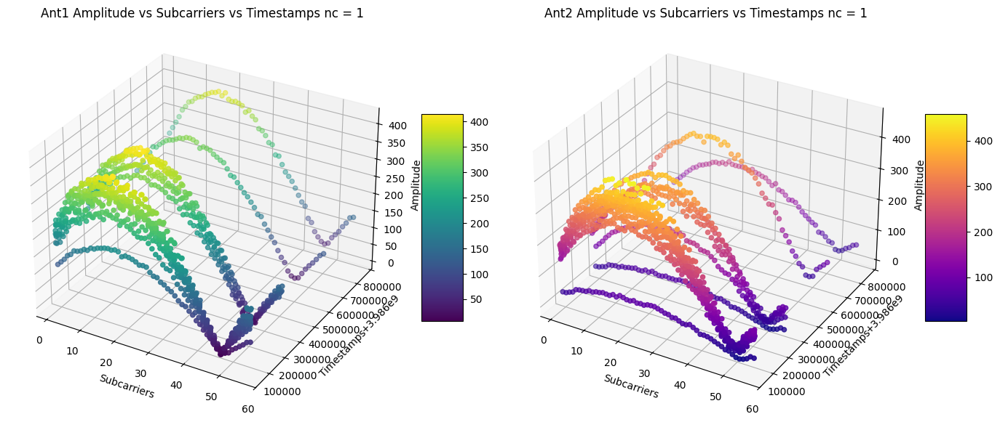

In [123]:
# Create a figure with two subplots for side-by-side 3D scatter plots
fig = plt.figure(figsize=(14, 6))

# First subplot for Ant1 Amplitude
ax1 = fig.add_subplot(121, projection='3d')
subcarriers = wo_7_6_0_nc_1["subcarriers"]
amplitude_ant1 = wo_7_6_0_nc_1["ant1_amplitude"]
timestamps = wo_7_6_0_nc_1["timestamps"]

# 3D scatter plot for Ant1
# scatter1 = ax1.scatter(subcarriers, timestamps, amplitude_ant1, c=amplitude_ant1, cmap='viridis')
scatter1 = ax1.scatter(subcarriers, timestamps, amplitude_ant1, c=amplitude_ant1, cmap='viridis')
ax1.set_xlabel('Subcarriers')
ax1.set_ylabel('Timestamps')
ax1.set_zlabel('Amplitude')
ax1.set_title('Ant1 Amplitude vs Subcarriers vs Timestamps nc = 1')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot for Ant2 Amplitude
ax2 = fig.add_subplot(122, projection='3d')
amplitude_ant2 = wo_7_6_0_nc_1["ant2_amplitude"]

# 3D scatter plot for Ant2
scatter2 = ax2.scatter(subcarriers, timestamps, amplitude_ant2, c=amplitude_ant2, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Amplitude')
ax2.set_title('Ant2 Amplitude vs Subcarriers vs Timestamps nc = 1')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Adjust layout and display
plt.tight_layout()
plt.show()

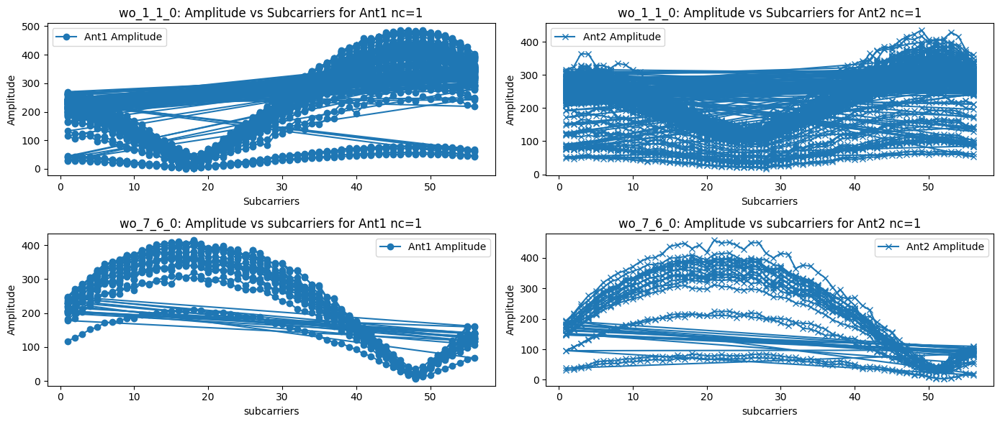

In [124]:
# Create a figure and set of subplots (2 columns)
fig, ax = plt.subplots(2, 2, figsize=(14, 6))

# Plot for Ant1 Amplitude on the first subplot
ax[0][0].plot(wo_1_1_0_nc_1["subcarriers"], wo_1_1_0_nc_1["ant1_amplitude"], label="Ant1 Amplitude", marker='o')
ax[0][0].set_xlabel("Subcarriers")
ax[0][0].set_ylabel("Amplitude")
ax[0][0].set_title("wo_1_1_0: Amplitude vs Subcarriers for Ant1 nc=1")
ax[0][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[0][1].plot(wo_1_1_0_nc_1["subcarriers"], wo_1_1_0_nc_1["ant2_amplitude"], label="Ant2 Amplitude", marker='x')
ax[0][1].set_xlabel("Subcarriers")
ax[0][1].set_ylabel("Amplitude")
ax[0][1].set_title("wo_1_1_0: Amplitude vs Subcarriers for Ant2 nc=1")
ax[0][1].legend()

# Plot for Ant1 Amplitude on the first subplot
ax[1][0].plot(wo_7_6_0_nc_1["subcarriers"], wo_7_6_0_nc_1["ant1_amplitude"], label="Ant1 Amplitude", marker='o')
ax[1][0].set_xlabel("subcarriers")
ax[1][0].set_ylabel("Amplitude")
ax[1][0].set_title("wo_7_6_0: Amplitude vs subcarriers for Ant1 nc=1")
ax[1][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[1][1].plot(wo_7_6_0_nc_1["subcarriers"], wo_7_6_0_nc_1["ant2_amplitude"], label="Ant2 Amplitude", marker='x')
ax[1][1].set_xlabel("subcarriers")
ax[1][1].set_ylabel("Amplitude")
ax[1][1].set_title("wo_7_6_0: Amplitude vs subcarriers for Ant2 nc=1")
ax[1][1].legend()

# Adjust the layout
plt.tight_layout()

# Show the plots
plt.show()

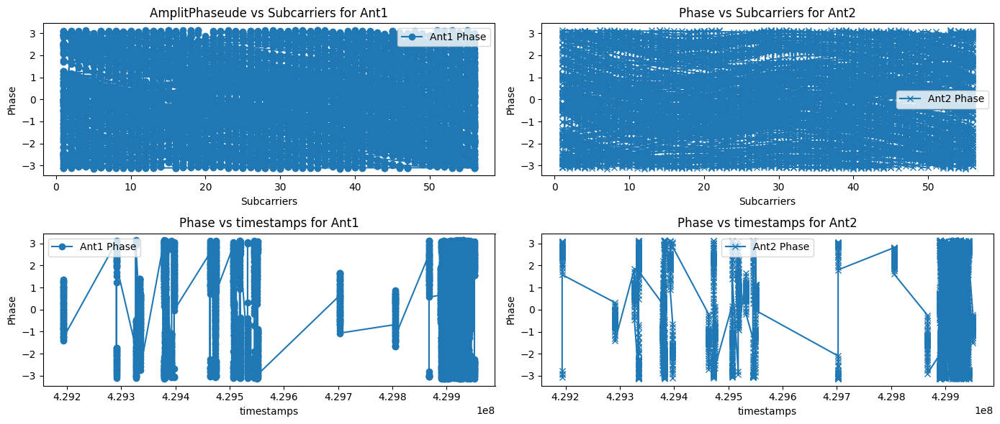

In [125]:
# Create a figure and set of subplots (2 columns)
fig, ax = plt.subplots(2, 2, figsize=(14, 6))

# Plot for Ant1 Amplitude on the first subplot
ax[0][0].plot(wo_1_1_0_nc_1["subcarriers"], wo_1_1_0_nc_1["ant1_phase"], label="Ant1 Phase", marker='o')
ax[0][0].set_xlabel("Subcarriers")
ax[0][0].set_ylabel("Phase")
ax[0][0].set_title("AmplitPhaseude vs Subcarriers for Ant1")
ax[0][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[0][1].plot(wo_1_1_0_nc_1["subcarriers"], wo_1_1_0_nc_1["ant2_phase"], label="Ant2 Phase", marker='x')
ax[0][1].set_xlabel("Subcarriers")
ax[0][1].set_ylabel("Phase")
ax[0][1].set_title("Phase vs Subcarriers for Ant2")
ax[0][1].legend()

# Plot for Ant1 Amplitude on the first subplot
ax[1][0].plot(wo_1_1_0_nc_1["timestamps"], wo_1_1_0_nc_1["ant1_phase"], label="Ant1 Phase", marker='o')
ax[1][0].set_xlabel("timestamps")
ax[1][0].set_ylabel("Phase")
ax[1][0].set_title("Phase vs timestamps for Ant1")
ax[1][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[1][1].plot(wo_1_1_0_nc_1["timestamps"], wo_1_1_0_nc_1["ant2_phase"], label="Ant2 Phase", marker='x')
ax[1][1].set_xlabel("timestamps")
ax[1][1].set_ylabel("Phase")
ax[1][1].set_title("Phase vs timestamps for Ant2")
ax[1][1].legend()

# Adjust the layout
plt.tight_layout()

# Show the plots
plt.show()

## NC == 2

In [126]:
wo_1_1_0_nc_2 = wo_1_1_0[wo_1_1_0['nc'] == 2]
wo_1_1_0_nc_2.head()

,timestamps,csi_len,rate,bandWidth,nc,rssi,rssi1,rssi2,payload_length,block_length,subcarriers,ant1_amplitude,ant2_amplitude,ant1_phase,ant2_phase
0,429192390,560,140,0,2,58,52,57,1320,1904,1,27.459060,92.070625,0.992894,-1.418147
1,429192390,560,140,0,2,58,52,57,1320,1904,2,27.459060,167.839209,-0.992894,1.994465
2,429192390,560,140,0,2,58,52,57,1320,1904,3,28.844410,94.339811,0.982794,-1.485895
3,429192390,560,140,0,2,58,52,57,1320,1904,4,29.154759,174.642492,-1.030377,1.983207
4,429192390,560,140,0,2,58,52,57,1320,1904,5,30.805844,89.453899,0.946773,-1.470015


In [127]:
wo_7_6_0_nc_2 = wo_7_6_0[wo_7_6_0['nc'] == 2]
wo_7_6_0_nc_2.head()

,timestamps,csi_len,rate,bandWidth,nc,rssi,rssi1,rssi2,payload_length,block_length,subcarriers,ant1_amplitude,ant2_amplitude,ant1_phase,ant2_phase
0,3985903916,560,141,0,2,59,53,58,1320,1904,1,215.102301,145.838952,0.139925,-2.791650
1,3985903916,560,141,0,2,59,53,58,1320,1904,2,173.769963,153.000000,1.362115,-2.060754
2,3985903916,560,141,0,2,59,53,58,1320,1904,3,222.643212,154.029218,0.121569,-2.838320
3,3985903916,560,141,0,2,59,53,58,1320,1904,4,181.686543,157.155973,1.343172,-2.082839
4,3985903916,560,141,0,2,59,53,58,1320,1904,5,226.797266,162.640708,0.083874,-2.854847


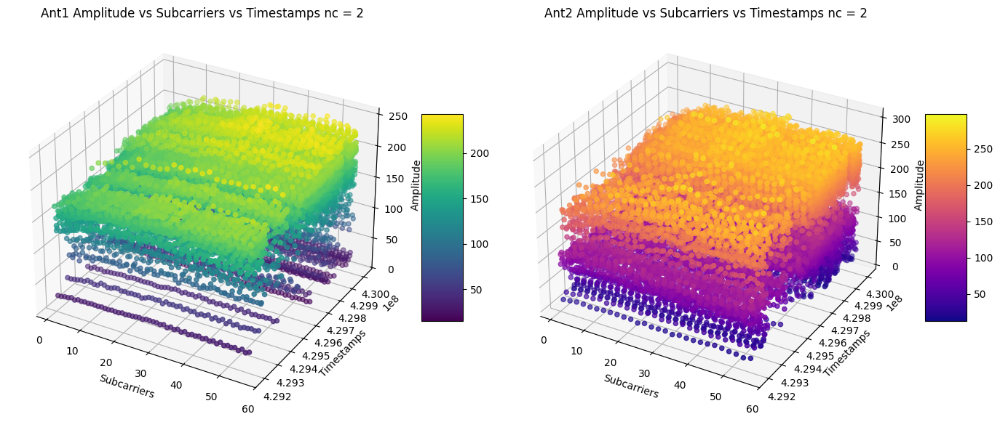

In [128]:
# Create a figure with two subplots for side-by-side 3D scatter plots
fig = plt.figure(figsize=(14, 6))

# First subplot for Ant1 Amplitude
ax1 = fig.add_subplot(121, projection='3d')
subcarriers = wo_1_1_0_nc_2["subcarriers"]
amplitude_ant1 = wo_1_1_0_nc_2["ant1_amplitude"]
timestamps = wo_1_1_0_nc_2["timestamps"]

# 3D scatter plot for Ant1
# scatter1 = ax1.scatter(subcarriers, timestamps, amplitude_ant1, c=amplitude_ant1, cmap='viridis')
scatter1 = ax1.scatter(subcarriers, timestamps, amplitude_ant1, c=amplitude_ant1, cmap='viridis')
ax1.set_ylabel('Timestamps')
ax1.set_xlabel('Subcarriers')
ax1.set_zlabel('Amplitude')
ax1.set_title('Ant1 Amplitude vs Subcarriers vs Timestamps nc = 2')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot for Ant2 Amplitude
ax2 = fig.add_subplot(122, projection='3d')
amplitude_ant2 = wo_1_1_0_nc_2["ant2_amplitude"]

# 3D scatter plot for Ant2
scatter2 = ax2.scatter(subcarriers, timestamps, amplitude_ant2, c=amplitude_ant2, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Amplitude')
ax2.set_title('Ant2 Amplitude vs Subcarriers vs Timestamps nc = 2')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Adjust layout and display
plt.tight_layout()
plt.show()

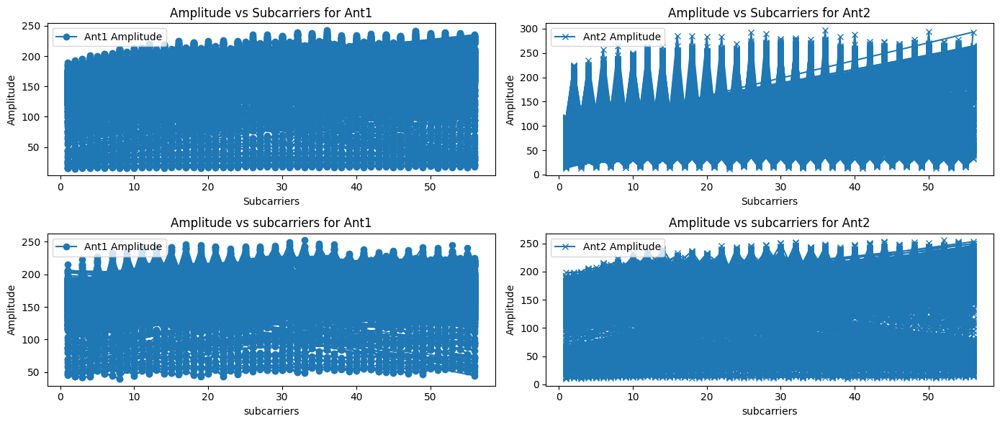

In [129]:
# Create a figure and set of subplots (2 columns)
fig, ax = plt.subplots(2, 2, figsize=(14, 6))

# Plot for Ant1 Amplitude on the first subplot
ax[0][0].plot(wo_1_1_0_nc_2["subcarriers"], wo_1_1_0_nc_2["ant1_amplitude"], label="Ant1 Amplitude", marker='o')
ax[0][0].set_xlabel("Subcarriers")
ax[0][0].set_ylabel("Amplitude")
ax[0][0].set_title("Amplitude vs Subcarriers for Ant1")
ax[0][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[0][1].plot(wo_1_1_0_nc_2["subcarriers"], wo_1_1_0_nc_2["ant2_amplitude"], label="Ant2 Amplitude", marker='x')
ax[0][1].set_xlabel("Subcarriers")
ax[0][1].set_ylabel("Amplitude")
ax[0][1].set_title("Amplitude vs Subcarriers for Ant2")
ax[0][1].legend()

# Plot for Ant1 Amplitude on the first subplot
ax[1][0].plot(wo_7_6_0_nc_2["subcarriers"], wo_7_6_0_nc_2["ant1_amplitude"], label="Ant1 Amplitude", marker='o')
ax[1][0].set_xlabel("subcarriers")
ax[1][0].set_ylabel("Amplitude")
ax[1][0].set_title("Amplitude vs subcarriers for Ant1")
ax[1][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[1][1].plot(wo_7_6_0_nc_2["subcarriers"], wo_7_6_0_nc_2["ant2_amplitude"], label="Ant2 Amplitude", marker='x')
ax[1][1].set_xlabel("subcarriers")
ax[1][1].set_ylabel("Amplitude")
ax[1][1].set_title("Amplitude vs subcarriers for Ant2")
ax[1][1].legend()

# Adjust the layout
plt.tight_layout()

# Show the plots
plt.show()

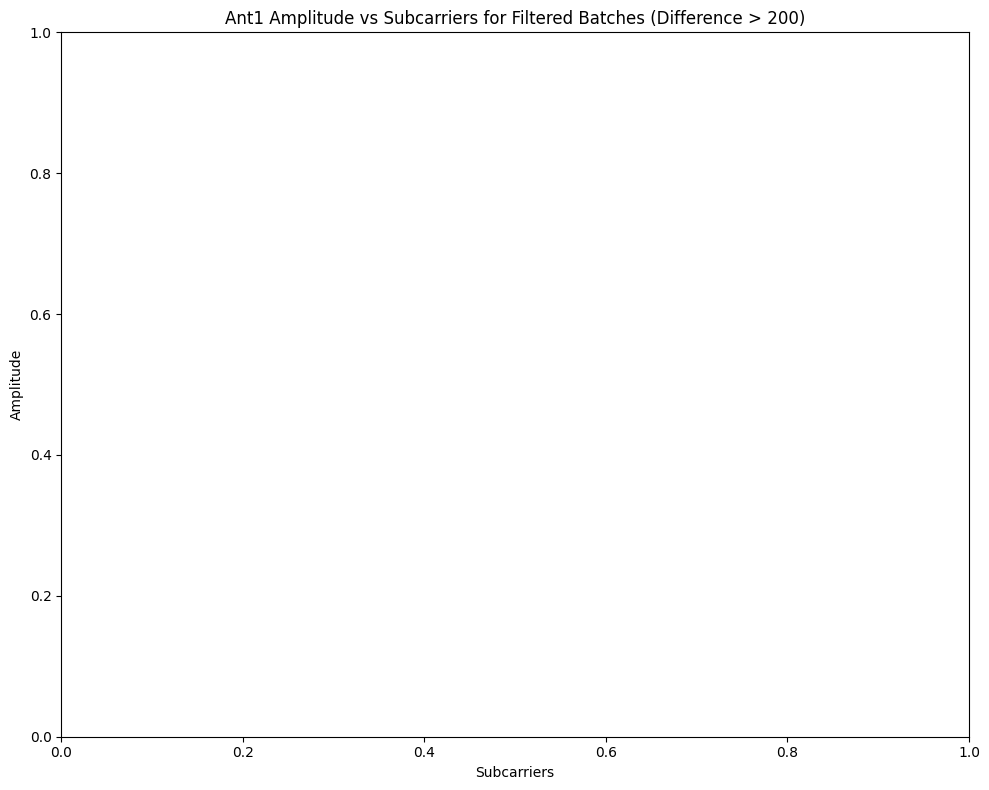

In [130]:
# Create an empty DataFrame to hold the valid batches
valid_batches_nc_2_ant1 = pd.DataFrame()

# Loop through batches of 56 rows
for i in range(len(wo_1_1_0_nc_2) // 56):
    start = i * 56
    end = start + 56
    
    # Extract the full batch (all columns)
    batch = wo_1_1_0_nc_2.iloc[start:end]
    
    # Calculate the difference between maximum and minimum amplitude in the batch
    amplitude_range = batch["ant1_amplitude"].max() - batch["ant1_amplitude"].min()
    
    # Filter: only keep batches where the difference is larger than 200
    if amplitude_range >= 100:
        # Append valid batches to the DataFrame
        valid_batches_nc_2_ant1 = pd.concat([valid_batches_nc_2_ant1, batch], ignore_index=True)

# Now valid_batches_df contains all rows where the condition is met.
# You can now work with the full dataset or visualize it.

# Example: plotting Ant1 Amplitude vs Subcarriers for the filtered batches
plt.figure(figsize=(10, 8))

for i in range(0, len(valid_batches_nc_2_ant1), 56):
    subcarriers_batch = valid_batches_nc_2_ant1["subcarriers"][i:i+56]
    amplitude_batch = valid_batches_nc_2_ant1["ant1_amplitude"][i:i+56]
    
    plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i//56 + 1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Ant1 Amplitude vs Subcarriers for Filtered Batches (Difference > 200)")
# plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

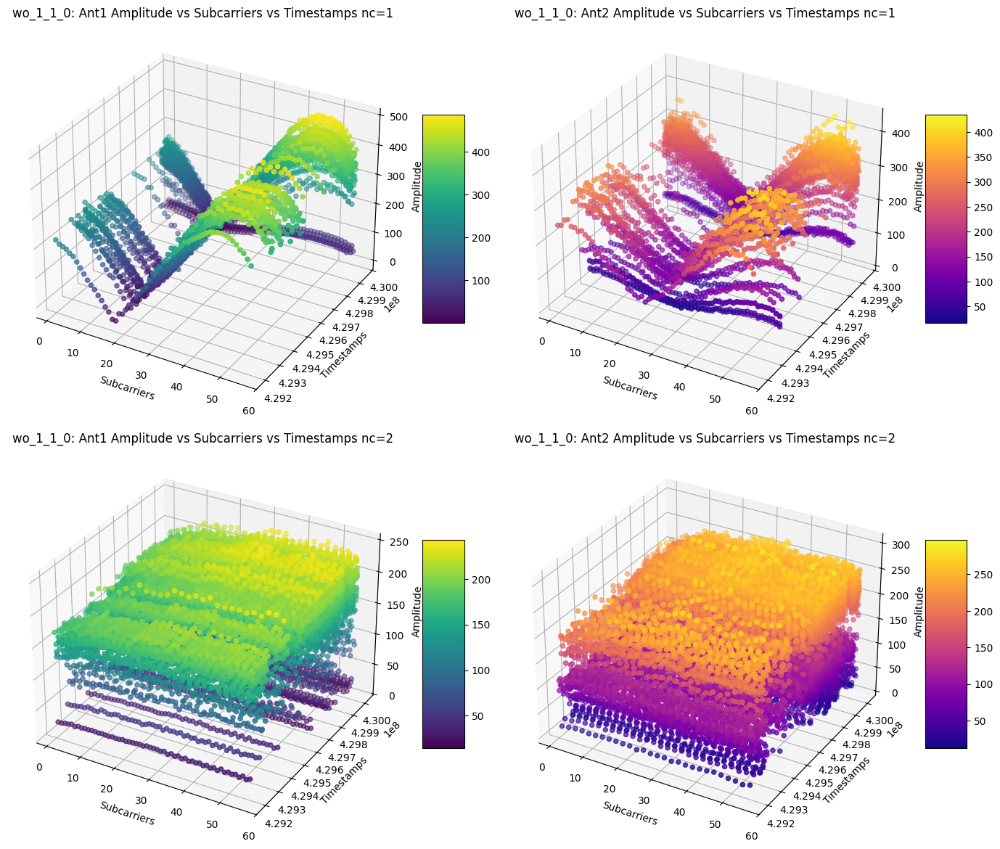

In [131]:
# Create a figure with 2x2 subplots for 3D scatter plots
fig = plt.figure(figsize=(14, 12))

# First subplot (top-left) for wo_1_1_0 Ant1 Amplitude
ax1 = fig.add_subplot(221, projection='3d')
subcarriers_1_1_0 = wo_1_1_0_nc_1["subcarriers"]
amplitude_ant1_1_1_0 = wo_1_1_0_nc_1["ant1_amplitude"]
timestamps_1_1_0 = wo_1_1_0_nc_1["timestamps"]

# 3D scatter plot for wo_1_1_0 Ant1
scatter1 = ax1.scatter(subcarriers_1_1_0, timestamps_1_1_0, amplitude_ant1_1_1_0, c=amplitude_ant1_1_1_0, cmap='viridis')
ax1.set_xlabel('Subcarriers')
ax1.set_ylabel('Timestamps')
ax1.set_zlabel('Amplitude')
ax1.set_title('wo_1_1_0: Ant1 Amplitude vs Subcarriers vs Timestamps nc=1')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot (top-right) for wo_1_1_0 Ant2 Amplitude
ax2 = fig.add_subplot(222, projection='3d')
amplitude_ant2_1_1_0 = wo_1_1_0_nc_1["ant2_amplitude"]

# 3D scatter plot for wo_1_1_0 Ant2
scatter2 = ax2.scatter(subcarriers_1_1_0, timestamps_1_1_0, amplitude_ant2_1_1_0, c=amplitude_ant2_1_1_0, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Amplitude')
ax2.set_title('wo_1_1_0: Ant2 Amplitude vs Subcarriers vs Timestamps nc=1')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Third subplot (bottom-left) for wo_7_6_0 Ant1 Amplitude
ax3 = fig.add_subplot(223, projection='3d')
subcarriers_7_6_0 = wo_1_1_0_nc_2["subcarriers"]
amplitude_ant1_7_6_0 = wo_1_1_0_nc_2["ant1_amplitude"]
timestamps_7_6_0 = wo_1_1_0_nc_2["timestamps"]

# 3D scatter plot for wo_7_6_0 Ant1
scatter3 = ax3.scatter(subcarriers_7_6_0, timestamps_7_6_0, amplitude_ant1_7_6_0, c=amplitude_ant1_7_6_0, cmap='viridis')
ax3.set_xlabel('Subcarriers')
ax3.set_ylabel('Timestamps')
ax3.set_zlabel('Amplitude')
ax3.set_title('wo_1_1_0: Ant1 Amplitude vs Subcarriers vs Timestamps nc=2')
fig.colorbar(scatter3, ax=ax3, shrink=0.5, aspect=5)

# Fourth subplot (bottom-right) for wo_7_6_0 Ant2 Amplitude
ax4 = fig.add_subplot(224, projection='3d')
amplitude_ant2_7_6_0 = wo_1_1_0_nc_2["ant2_amplitude"]

# 3D scatter plot for wo_7_6_0 Ant2
scatter4 = ax4.scatter(subcarriers_7_6_0, timestamps_7_6_0, amplitude_ant2_7_6_0, c=amplitude_ant2_7_6_0, cmap='plasma')
ax4.set_xlabel('Subcarriers')
ax4.set_ylabel('Timestamps')
ax4.set_zlabel('Amplitude')
ax4.set_title('wo_1_1_0: Ant2 Amplitude vs Subcarriers vs Timestamps nc=2')
fig.colorbar(scatter4, ax=ax4, shrink=0.5, aspect=5)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

# Phase Unwrapping & Detrend

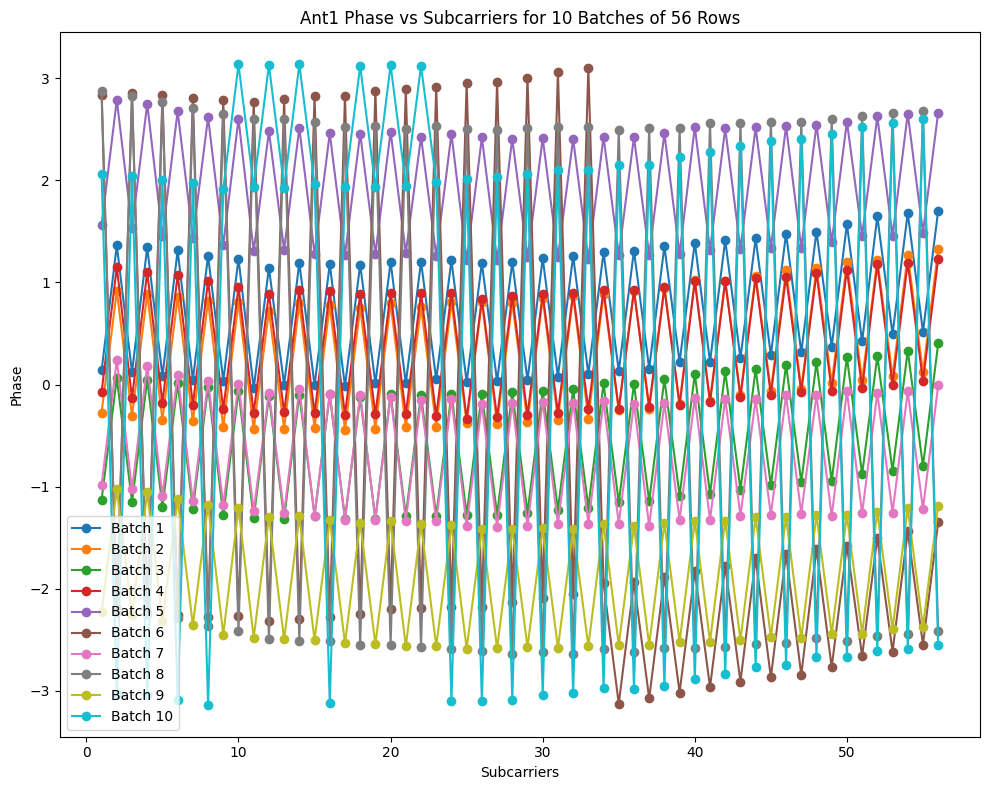

In [132]:
plt.figure(figsize=(10, 8))

# Plot 10 graphs, each containing 56 rows of data
for i in range(10):
    start = i * 56
    end = start + 56
    subcarriers_batch = wo_7_6_0["subcarriers"][start:end]
    amplitude_batch = wo_7_6_0["ant1_phase"][start:end]
    
    plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i+1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Phase")
plt.title("Ant1 Phase vs Subcarriers for 10 Batches of 56 Rows")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [133]:
wo_1_1_0['ant1_phase_unwrapped'] = np.unwrap(wo_1_1_0['ant1_phase'].values)
wo_1_1_0['ant2_phase_unwrapped'] = np.unwrap(wo_1_1_0['ant2_phase'].values)

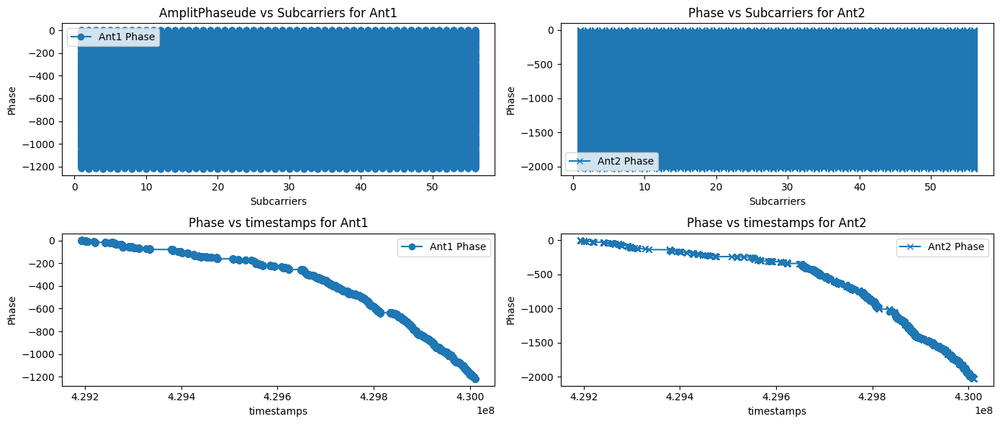

In [134]:
# Create a figure and set of subplots (2 columns)
fig, ax = plt.subplots(2, 2, figsize=(14, 6))

# Plot for Ant1 Amplitude on the first subplot
ax[0][0].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant1_phase_unwrapped"], label="Ant1 Phase", marker='o')
ax[0][0].set_xlabel("Subcarriers")
ax[0][0].set_ylabel("Phase")
ax[0][0].set_title("AmplitPhaseude vs Subcarriers for Ant1")
ax[0][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[0][1].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant2_phase_unwrapped"], label="Ant2 Phase", marker='x')
ax[0][1].set_xlabel("Subcarriers")
ax[0][1].set_ylabel("Phase")
ax[0][1].set_title("Phase vs Subcarriers for Ant2")
ax[0][1].legend()

# Plot for Ant1 Amplitude on the first subplot
ax[1][0].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant1_phase_unwrapped"], label="Ant1 Phase", marker='o')
ax[1][0].set_xlabel("timestamps")
ax[1][0].set_ylabel("Phase")
ax[1][0].set_title("Phase vs timestamps for Ant1")
ax[1][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[1][1].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant2_phase_unwrapped"], label="Ant2 Phase", marker='x')
ax[1][1].set_xlabel("timestamps")
ax[1][1].set_ylabel("Phase")
ax[1][1].set_title("Phase vs timestamps for Ant2")
ax[1][1].legend()

# Adjust the layout
plt.tight_layout()

# Show the plots
plt.show()

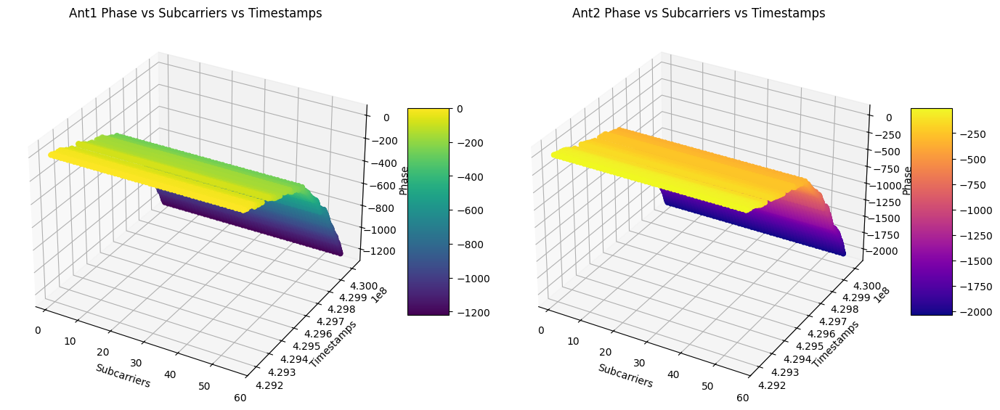

In [135]:
# Create a figure with two subplots for side-by-side 3D scatter plots
fig = plt.figure(figsize=(14, 6))

# First subplot for Ant1 Phase
ax1 = fig.add_subplot(121, projection='3d')
subcarriers = wo_1_1_0["subcarriers"]
phase_ant1 = wo_1_1_0["ant1_phase_unwrapped"]
timestamps = wo_1_1_0["timestamps"]

# 3D scatter plot for Ant1 Phase
scatter1 = ax1.scatter(subcarriers, timestamps, phase_ant1, c=phase_ant1, cmap='viridis')
ax1.set_xlabel('Subcarriers')
ax1.set_ylabel('Timestamps')
ax1.set_zlabel('Phase')
ax1.set_title('Ant1 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot for Ant2 Phase
ax2 = fig.add_subplot(122, projection='3d')
phase_ant2 = wo_1_1_0["ant2_phase_unwrapped"]

# 3D scatter plot for Ant2 Phase
scatter2 = ax2.scatter(subcarriers, timestamps, phase_ant2, c=phase_ant2, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Phase')
ax2.set_title('Ant2 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Adjust layout and display
plt.tight_layout()
plt.show()

In [136]:
from scipy.signal import detrend

wo_1_1_0['ant1_phase_detrend'] = detrend(wo_1_1_0['ant1_phase_unwrapped'].values)
wo_1_1_0['ant2_phase_detrend'] = detrend(wo_1_1_0['ant2_phase_unwrapped'].values)

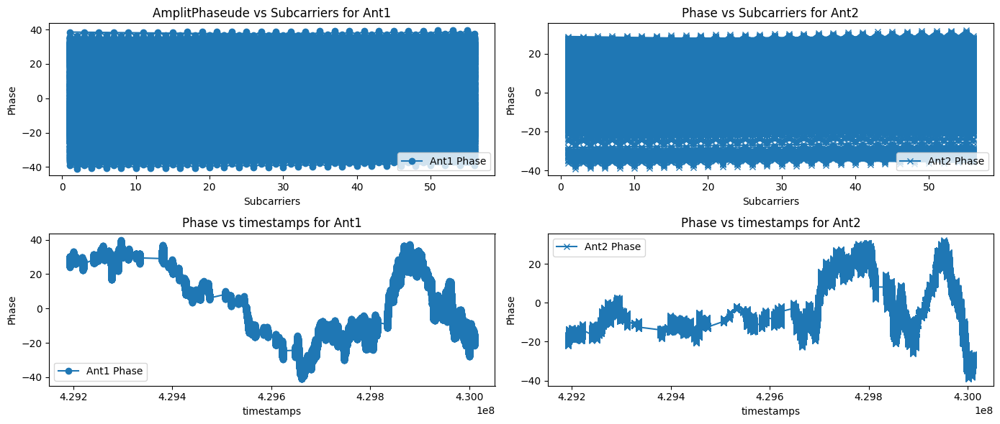

In [137]:
# Create a figure and set of subplots (2 columns)
fig, ax = plt.subplots(2, 2, figsize=(14, 6))

# Plot for Ant1 Amplitude on the first subplot
ax[0][0].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant1_phase_detrend"], label="Ant1 Phase", marker='o')
ax[0][0].set_xlabel("Subcarriers")
ax[0][0].set_ylabel("Phase")
ax[0][0].set_title("AmplitPhaseude vs Subcarriers for Ant1")
ax[0][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[0][1].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant2_phase_detrend"], label="Ant2 Phase", marker='x')
ax[0][1].set_xlabel("Subcarriers")
ax[0][1].set_ylabel("Phase")
ax[0][1].set_title("Phase vs Subcarriers for Ant2")
ax[0][1].legend()

# Plot for Ant1 Amplitude on the first subplot
ax[1][0].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant1_phase_detrend"], label="Ant1 Phase", marker='o')
ax[1][0].set_xlabel("timestamps")
ax[1][0].set_ylabel("Phase")
ax[1][0].set_title("Phase vs timestamps for Ant1")
ax[1][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[1][1].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant2_phase_detrend"], label="Ant2 Phase", marker='x')
ax[1][1].set_xlabel("timestamps")
ax[1][1].set_ylabel("Phase")
ax[1][1].set_title("Phase vs timestamps for Ant2")
ax[1][1].legend()

# Adjust the layout
plt.tight_layout()

# Show the plots
plt.show()

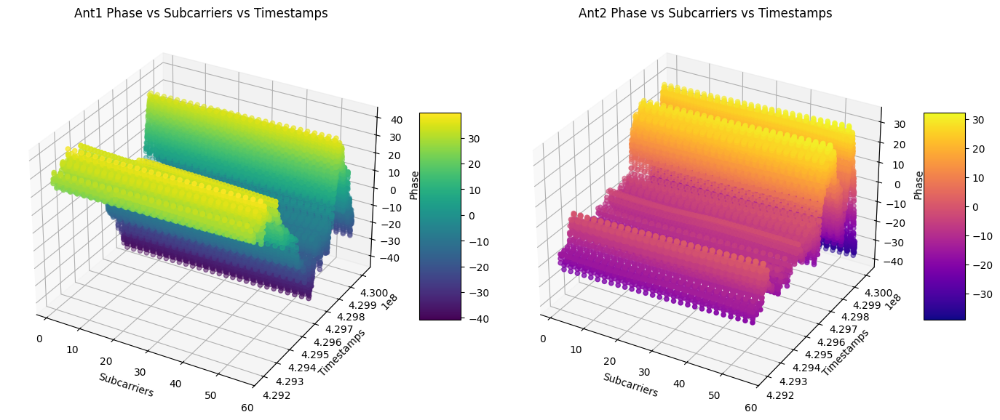

In [138]:
# Create a figure with two subplots for side-by-side 3D scatter plots
fig = plt.figure(figsize=(14, 6))

# First subplot for Ant1 Phase
ax1 = fig.add_subplot(121, projection='3d')
subcarriers = wo_1_1_0["subcarriers"]
phase_ant1 = wo_1_1_0["ant1_phase_detrend"]
timestamps = wo_1_1_0["timestamps"]

# 3D scatter plot for Ant1 Phase
scatter1 = ax1.scatter(subcarriers, timestamps, phase_ant1, c=phase_ant1, cmap='viridis')
ax1.set_xlabel('Subcarriers')
ax1.set_ylabel('Timestamps')
ax1.set_zlabel('Phase')
ax1.set_title('Ant1 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot for Ant2 Phase
ax2 = fig.add_subplot(122, projection='3d')
phase_ant2 = wo_1_1_0["ant2_phase_detrend"]

# 3D scatter plot for Ant2 Phase
scatter2 = ax2.scatter(subcarriers, timestamps, phase_ant2, c=phase_ant2, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Phase')
ax2.set_title('Ant2 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Adjust layout and display
plt.tight_layout()
plt.show()

In [139]:
# Calculate the correlation matrix
correlation_matrix = wo_1_1_0[['nc', 'ant1_amplitude', 'ant2_amplitude']].corr()

# Display the correlation matrix
print(correlation_matrix)

                      nc  ant1_amplitude  ant2_amplitude
nc              1.000000       -0.314380       -0.321806
ant1_amplitude -0.314380        1.000000        0.302833
ant2_amplitude -0.321806        0.302833        1.000000


In [140]:
nc1_amplitudes = wo_1_1_0_nc_1[['ant1_amplitude', 'ant2_amplitude']]
nc2_amplitudes = wo_1_1_0_nc_2[['ant1_amplitude', 'ant2_amplitude']]
nc2_amplitudes2 = wo_7_6_0_nc_2[['ant1_amplitude', 'ant2_amplitude']]

# Calculate the correlation between NC1 and NC2 amplitude data
correlation_matrix = nc2_amplitudes.corrwith(nc2_amplitudes2)

# Display the correlation between NC1 and NC2 amplitudes
print(correlation_matrix)


ant1_amplitude    0.024032
ant2_amplitude    0.147497
dtype: float64


Explained variance by each component: [0.43063194 0.26055847]


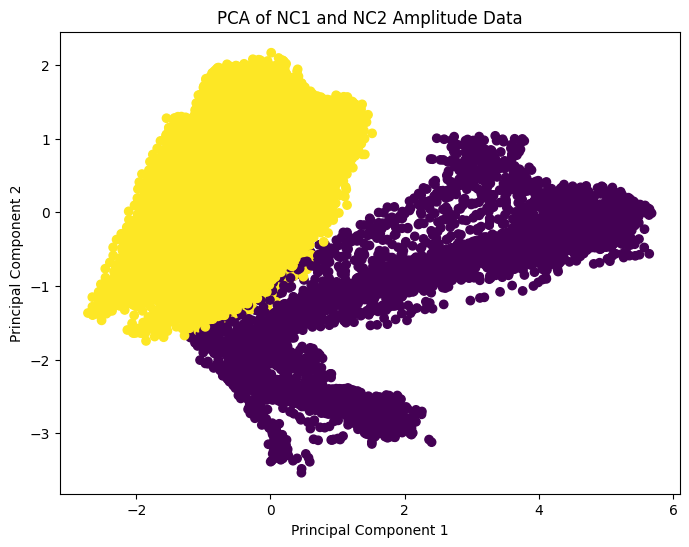

In [141]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Assuming 'data' contains your amplitude and subcarrier data
X = wo_1_1_0[['subcarriers', 'ant1_amplitude', 'ant2_amplitude', 'nc']]  # Include 'nc' to check if it helps
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # Standardize data

# Apply PCA
pca = PCA(n_components=2)  # Reduce to 2 components for visualization
X_pca = pca.fit_transform(X_scaled)

# Check how much variance is captured by the components
print(f"Explained variance by each component: {pca.explained_variance_ratio_}")

# Visualize the results
plt.figure(figsize=(8,6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=wo_1_1_0['nc'])  # Color by 'nc' (NC1 or NC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of NC1 and NC2 Amplitude Data')
plt.show()


# Something

In [142]:
data = pd.read_csv("data/csv/still_with_receiver/0/w_7_5_0.csv")

In [143]:
ant1_amplitude = data['ant1_amplitude']
ant2_amplitude = data['ant2_amplitude']
# For individual normalization
ant1_amp_mean = np.mean(ant1_amplitude)
ant1_amp_std = np.std(ant1_amplitude)
ant1_amp_normalized = (ant1_amplitude - ant1_amp_mean) / ant1_amp_std

ant2_amp_mean = np.mean(ant2_amplitude)
ant2_amp_std = np.std(ant2_amplitude)
ant2_amp_normalized = (ant2_amplitude - ant2_amp_mean) / ant2_amp_std

# For joint normalization
combined_amplitude = np.concatenate((ant1_amplitude, ant2_amplitude))
amp_mean = np.mean(combined_amplitude)
amp_std = np.std(combined_amplitude)
ant1_amp_normalized = (ant1_amplitude - amp_mean) / amp_std
ant2_amp_normalized = (ant2_amplitude - amp_mean) / amp_std


In [144]:
ant1_phase = data['ant1_phase']
ant2_phase = data['ant2_phase']

ant1_phase_unwrapped = np.unwrap(ant1_phase)
ant2_phase_unwrapped = np.unwrap(ant2_phase)

ant1_phase_calibrated = ant1_phase_unwrapped - np.mean(ant1_phase_unwrapped)
ant2_phase_calibrated = ant2_phase_unwrapped - np.mean(ant2_phase_unwrapped)



In [145]:
ant1_csi_complex = ant1_amp_normalized * np.exp(1j * ant1_phase_calibrated)
ant2_csi_complex = ant2_amp_normalized * np.exp(1j * ant2_phase_calibrated)

# Option 1: Stack along a new dimension
csi_complex = np.stack((ant1_csi_complex, ant2_csi_complex), axis=-1)

ant1_real = np.real(ant1_csi_complex)
ant1_imag = np.imag(ant1_csi_complex)
ant2_real = np.real(ant2_csi_complex)
ant2_imag = np.imag(ant2_csi_complex)

# Combine all features
input_data = np.stack((ant1_real, ant1_imag, ant2_real, ant2_imag), axis=-1)


In [146]:
amplitude_difference = ant1_amp_normalized - ant2_amp_normalized
phase_difference = ant1_phase_calibrated - ant2_phase_calibrated

# Optionally include these as additional features
input_data = np.stack((
    ant1_real, ant1_imag,
    ant2_real, ant2_imag,
    amplitude_difference,
    phase_difference
), axis=-1)


In [147]:
sequence_length = 100  # Example sequence length
num_sequences = len(input_data) // sequence_length

input_sequences = input_data[:num_sequences * sequence_length].reshape(
    num_sequences, sequence_length, -1)


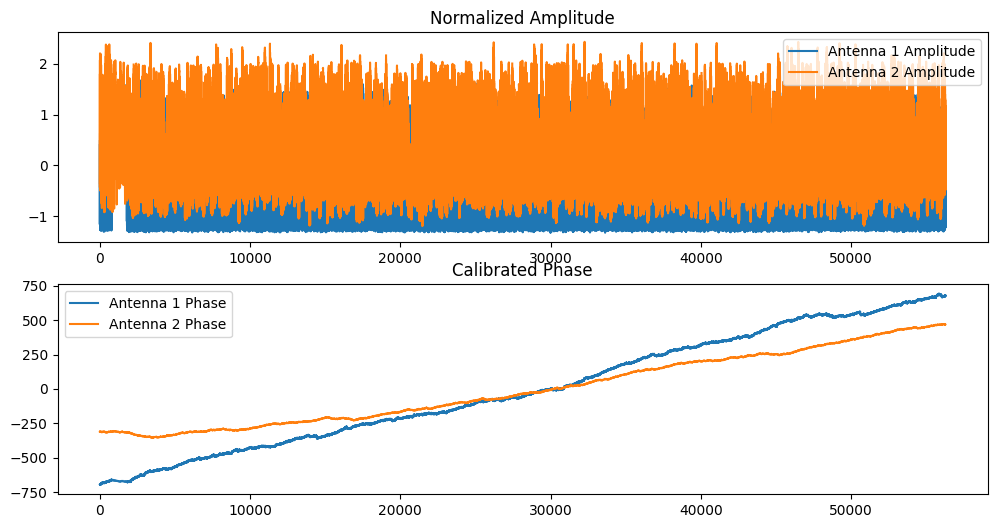

In [148]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(ant1_amp_normalized, label='Antenna 1 Amplitude')
plt.plot(ant2_amp_normalized, label='Antenna 2 Amplitude')
plt.legend()
plt.title('Normalized Amplitude')

plt.subplot(2, 1, 2)
plt.plot(ant1_phase_calibrated, label='Antenna 1 Phase')
plt.plot(ant2_phase_calibrated, label='Antenna 2 Phase')
plt.legend()
plt.title('Calibrated Phase')
plt.show()


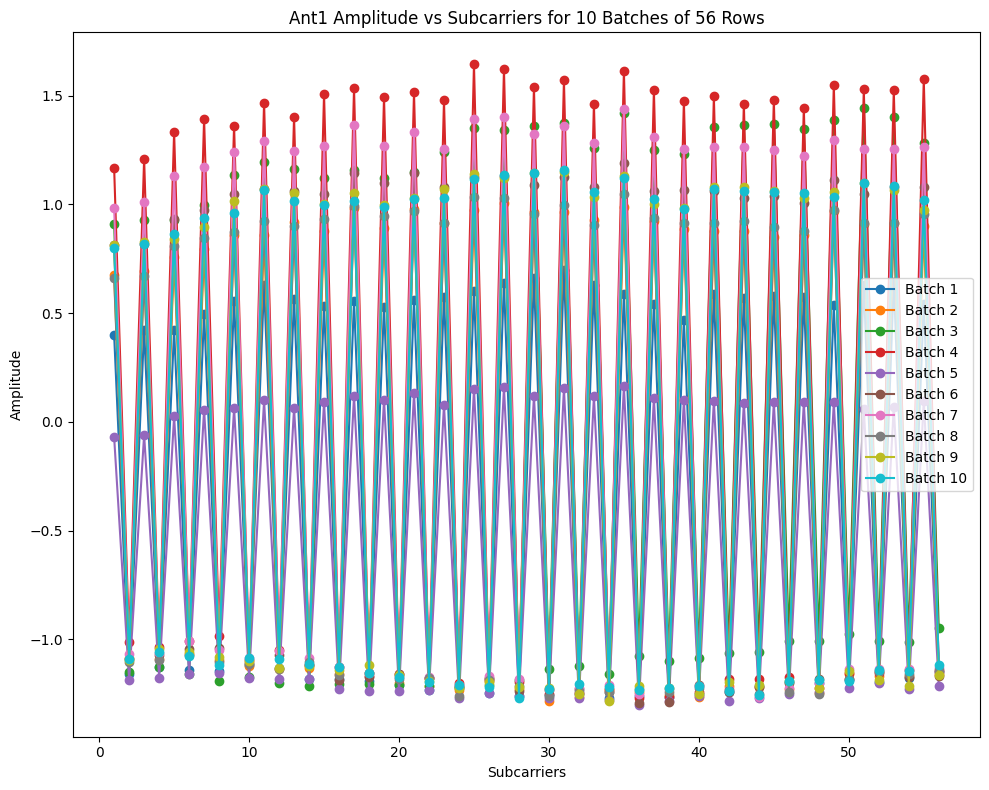

In [149]:
plt.figure(figsize=(10, 8))

# Plot 10 graphs, each containing 56 rows of data
# for i in range(round(len(ant1_amp_normalized)/56)):
for i in range(10):
    start = i * 56
    end = start + 56
    subcarriers_batch = np.arange(1, 57)
    amplitude_batch = ant1_amp_normalized[start:end]
    
    plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i+1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Ant1 Amplitude vs Subcarriers for 10 Batches of 56 Rows")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [150]:
data['ant1_amp_normalized'] = ant1_amp_normalized
data['ant2_amp_normalized'] = ant2_amp_normalized

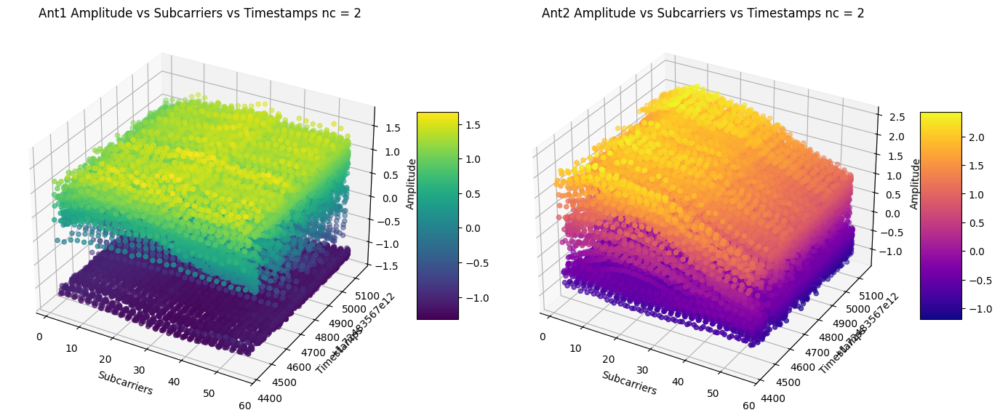

In [151]:
# Create a figure with two subplots for side-by-side 3D scatter plots
fig = plt.figure(figsize=(14, 6))

# First subplot for Ant1 Amplitude
ax1 = fig.add_subplot(121, projection='3d')
subcarriers = data["subcarriers"]
amplitude_ant1 = data["ant1_amp_normalized"]
timestamps = data["timestamps"]

# 3D scatter plot for Ant1
# scatter1 = ax1.scatter(subcarriers, timestamps, amplitude_ant1, c=amplitude_ant1, cmap='viridis')
scatter1 = ax1.scatter(subcarriers, timestamps, amplitude_ant1, c=amplitude_ant1, cmap='viridis')
ax1.set_ylabel('Timestamps')
ax1.set_xlabel('Subcarriers')
ax1.set_zlabel('Amplitude')
ax1.set_title('Ant1 Amplitude vs Subcarriers vs Timestamps nc = 2')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot for Ant2 Amplitude
ax2 = fig.add_subplot(122, projection='3d')
amplitude_ant2 = data["ant2_amp_normalized"]

# 3D scatter plot for Ant2
scatter2 = ax2.scatter(subcarriers, timestamps, amplitude_ant2, c=amplitude_ant2, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Amplitude')
ax2.set_title('Ant2 Amplitude vs Subcarriers vs Timestamps nc = 2')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Adjust layout and display
plt.tight_layout()
plt.show()

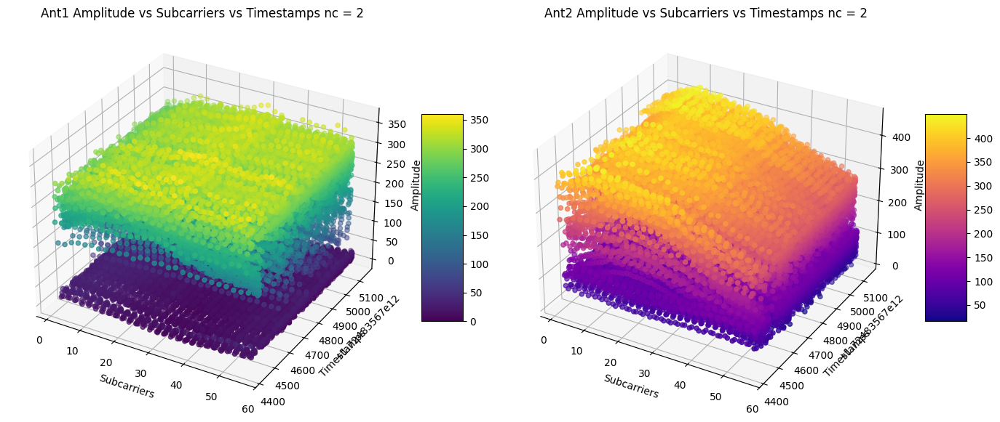

In [152]:
# Create a figure with two subplots for side-by-side 3D scatter plots
fig = plt.figure(figsize=(14, 6))

# First subplot for Ant1 Amplitude
ax1 = fig.add_subplot(121, projection='3d')
subcarriers = data["subcarriers"]
amplitude_ant1 = data["ant1_amplitude"]
timestamps = data["timestamps"]

# 3D scatter plot for Ant1
# scatter1 = ax1.scatter(subcarriers, timestamps, amplitude_ant1, c=amplitude_ant1, cmap='viridis')
scatter1 = ax1.scatter(subcarriers, timestamps, amplitude_ant1, c=amplitude_ant1, cmap='viridis')
ax1.set_ylabel('Timestamps')
ax1.set_xlabel('Subcarriers')
ax1.set_zlabel('Amplitude')
ax1.set_title('Ant1 Amplitude vs Subcarriers vs Timestamps nc = 2')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot for Ant2 Amplitude
ax2 = fig.add_subplot(122, projection='3d')
amplitude_ant2 = data["ant2_amplitude"]

# 3D scatter plot for Ant2
scatter2 = ax2.scatter(subcarriers, timestamps, amplitude_ant2, c=amplitude_ant2, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Amplitude')
ax2.set_title('Ant2 Amplitude vs Subcarriers vs Timestamps nc = 2')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Adjust layout and display
plt.tight_layout()
plt.show()

# FFT

In [153]:
import numpy as np
import matplotlib.pyplot as plt

subcarriers = data['subcarriers']
# Perform Fourier Transform on the amplitude with respect to subcarriers
fft_ant1_sub = np.fft.fft(amplitude_ant1)
fft_ant2_sub = np.fft.fft(amplitude_ant2)

# Generate frequency bins corresponding to subcarrier indices
n = len(subcarriers)
freq_sub = np.fft.fftfreq(n)




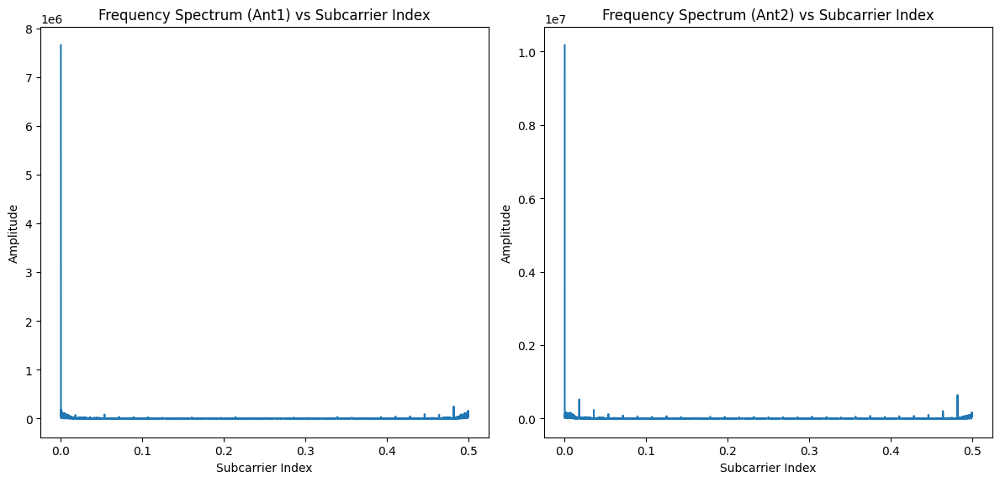

In [154]:
# Plot the amplitude spectrum for Ant1 and Ant2
plt.figure(figsize=(12, 6))

# Plot Ant1
plt.subplot(1, 2, 1)
plt.plot(freq_sub[:n//2], np.abs(fft_ant1_sub)[:n//2])  # Only the positive half
plt.title('Frequency Spectrum (Ant1) vs Subcarrier Index')
plt.xlabel('Subcarrier Index')
plt.ylabel('Amplitude')

# Plot Ant2
plt.subplot(1, 2, 2)
plt.plot(freq_sub[:n//2], np.abs(fft_ant2_sub)[:n//2])  # Only the positive half
plt.title('Frequency Spectrum (Ant2) vs Subcarrier Index')
plt.xlabel('Subcarrier Index')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()

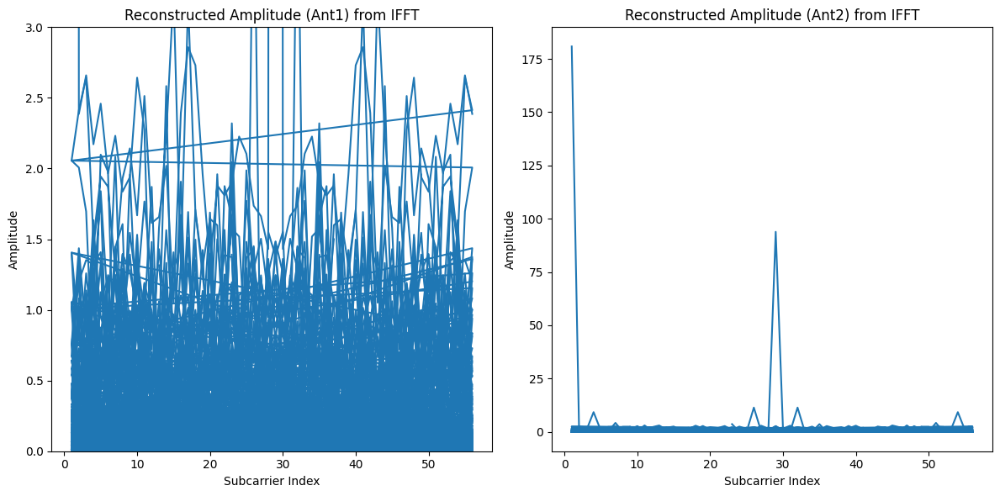

In [155]:
# Assuming you already applied FFT and now want to revert it using IFFT

# Perform Inverse FFT on Ant1 and Ant2
ifft_ant1 = np.fft.ifft(amplitude_ant1)
ifft_ant2 = np.fft.ifft(amplitude_ant2)

# Plot the reconstructed signals from IFFT (which should resemble original amplitude data)
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(subcarriers, np.abs(ifft_ant1))  # Ant1 after IFFT
plt.title('Reconstructed Amplitude (Ant1) from IFFT')
plt.xlabel('Subcarrier Index')
plt.ylabel('Amplitude')
plt.ylim(top=3)
plt.ylim(bottom=0)

plt.subplot(1, 2, 2)
plt.plot(subcarriers, np.abs(ifft_ant2))  # Ant2 after IFFT
plt.title('Reconstructed Amplitude (Ant2) from IFFT')
plt.xlabel('Subcarrier Index')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()